# Otros

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn import datasets
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_samples
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

In [5]:
# Visualizacion del DF entero

pd.set_option('display.max_columns', None)

## Importo data

In [7]:
data_completa = pd.read_csv("data_completa_con_cluster.csv")
data_completa.shape

(180021, 98)

## Creo variable jugadores_cluster_3

In [7]:
# Filtrar la tabla para mostrar únicamente los jugadores con cluster igual a 3
jugadores_cluster_3 = data_completa[data_completa['cluster'] == 3]

# Mostrar los datos filtrados
print(jugadores_cluster_3)

        id_jugador           nombre_jugador  version_x          posiciones  \
17            1099            Marco Di Vaio       2015                  DC   
27            1625            Thierry Henry       2015        MPN, DC, MEI   
28            1803           Javier Saviola       2015             DC, MCO   
32            2152  Leonardo Vitor Santiago       2015  MPN, EXD, EXI, MCO   
36            2264      Raul Tamudo Montero       2015             DC, MCO   
...            ...                      ...        ...                 ...   
180006      278111           Robert Silaghi       2024                 MCO   
180008      278113              Mihaly Kata       2024            MEC, MCD   
180011      278119                Ibou Sane       2024                  DC   
180015      278130        Umut Yasar Kececi       2024                  DC   
180017      278138               Josh Keyes       2024                 MEC   

        est_general_x  valor_de_mercado  salario_semanal  edad 

In [8]:
jugadores_cluster_3["version_x"].unique()

array([2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024])

In [9]:
jugadores_cluster_3.columns

Index(['id_jugador', 'nombre_jugador', 'version_x', 'posiciones',
       'est_general_x', 'valor_de_mercado', 'salario_semanal', 'edad',
       'nacimiento', 'altura', 'id_equipo', 'nombre_club_x', 'id_liga_x',
       'nombre_liga_x', 'posicion_club', 'id_nacionalidad_x', 'nacionalidad',
       'pierna', 'ritmo', 'chut', 'pase', 'regate', 'defensa_x', 'fisico',
       'centros_ataque', 'finalizacion', 'remate_cabeza', 'pase_corto_ataque',
       'volea', 'habilidad_regate', 'efecto', 'eficacia_faltas',
       'habilidad_pase_largo', 'habilidad_control', 'aceleracion',
       'velocidad_max', 'agilidad', 'reaccion', 'equilibrio', 'potencia_tiro',
       'potencia_salto', 'aguante', 'fortaleza', 'fuerza_chuts_lejanos',
       'agresividad', 'anticipacion', 'posicionamiento', 'vision_juego',
       'penalties', 'marcaje', 'abordaje', 'entrada', 'estirada', 'manejo',
       'pateo', 'posicion_por', 'reflejos', 'velocidad_por', 'del_izq', 'del',
       'del_dch', 'extr_izq', 'seg_del_izq', 

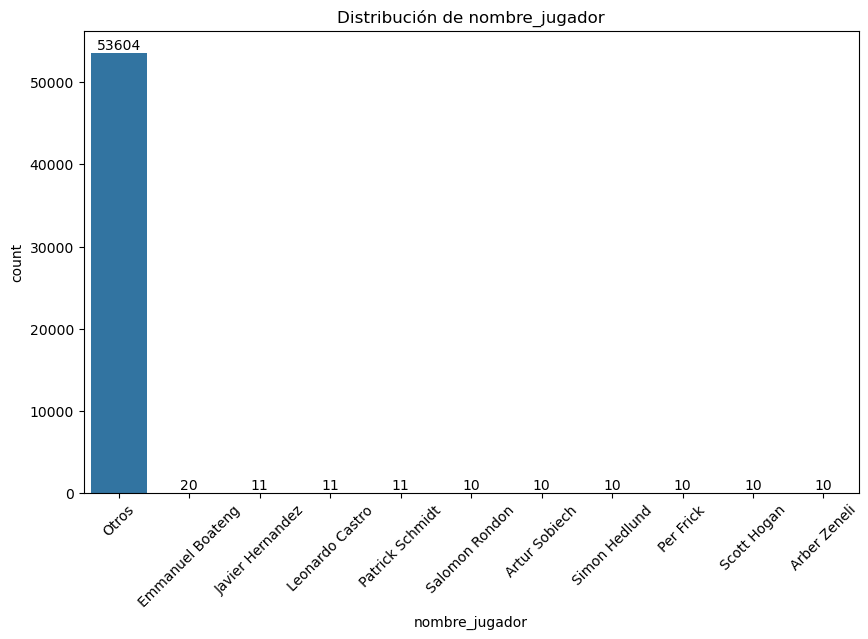

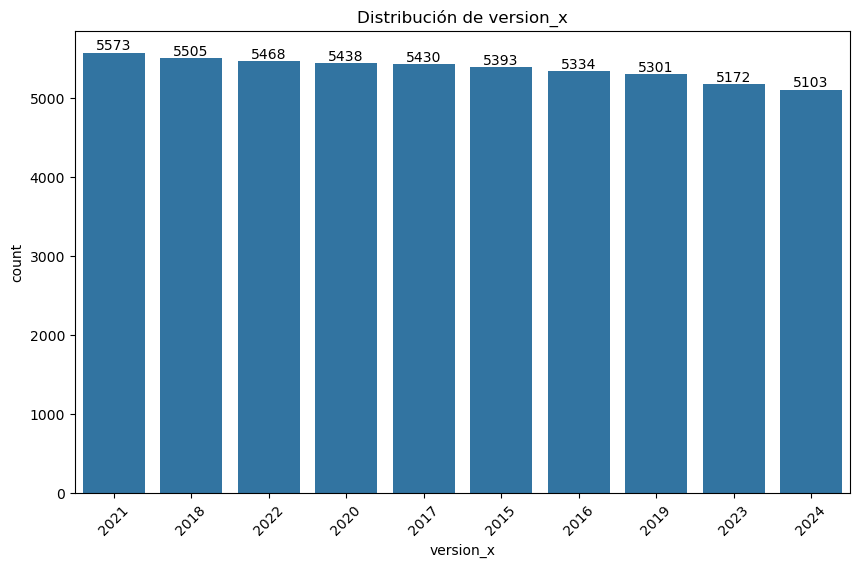

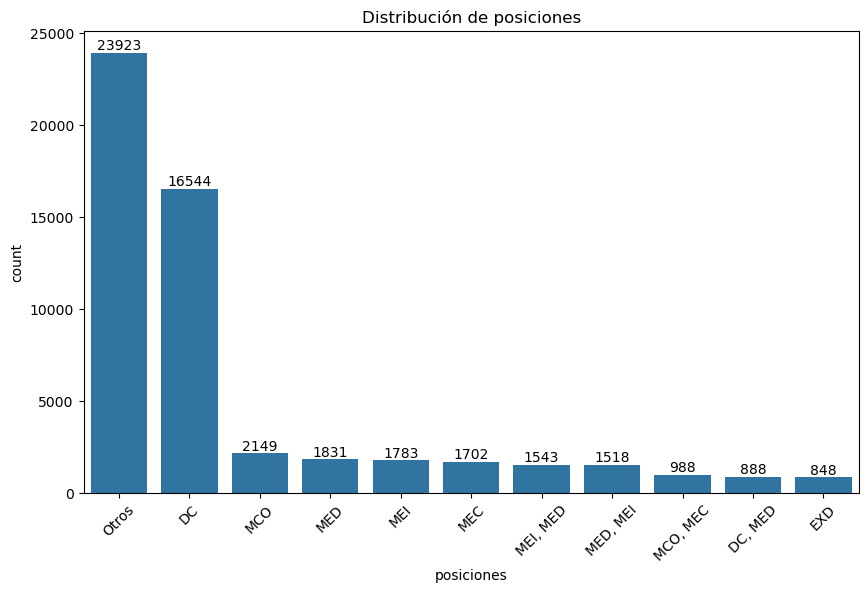

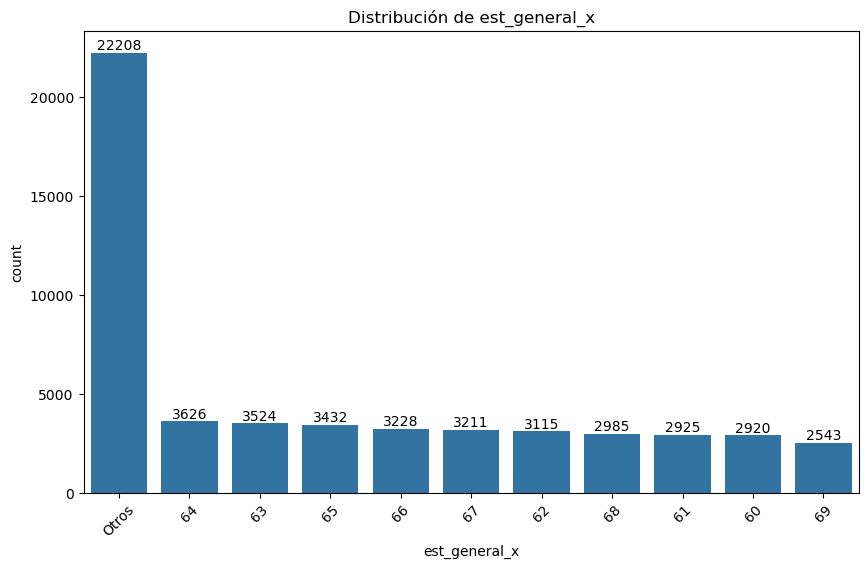

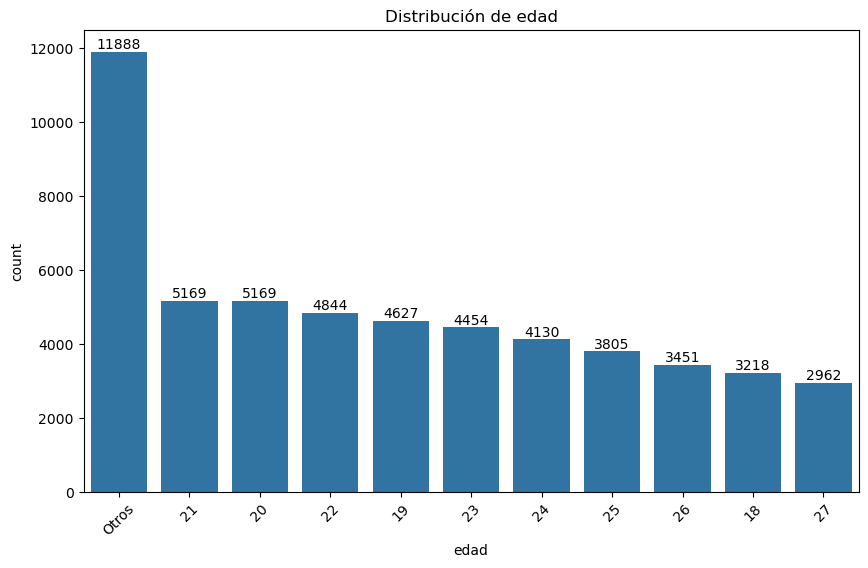

...

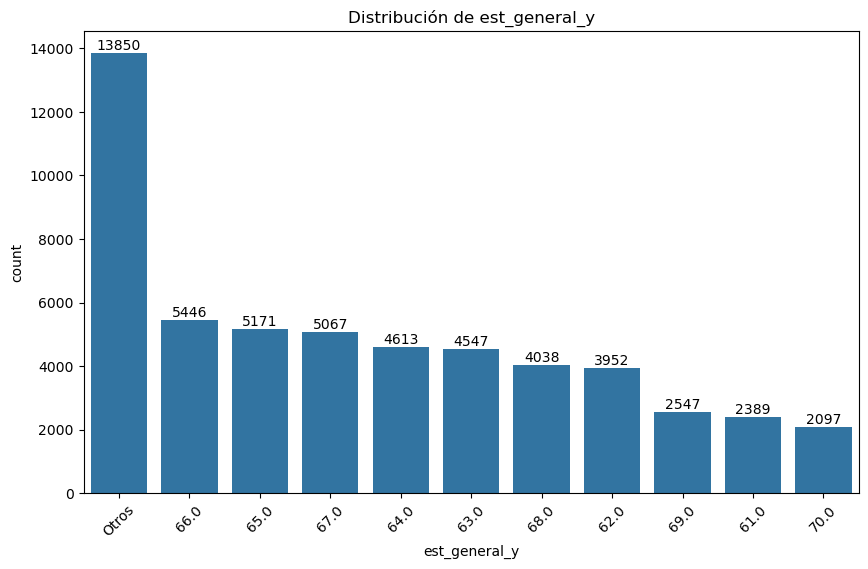

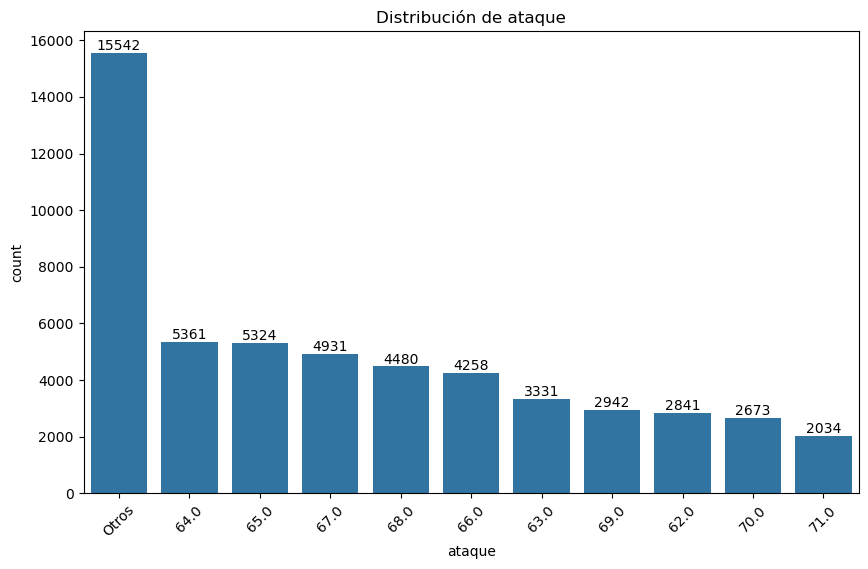

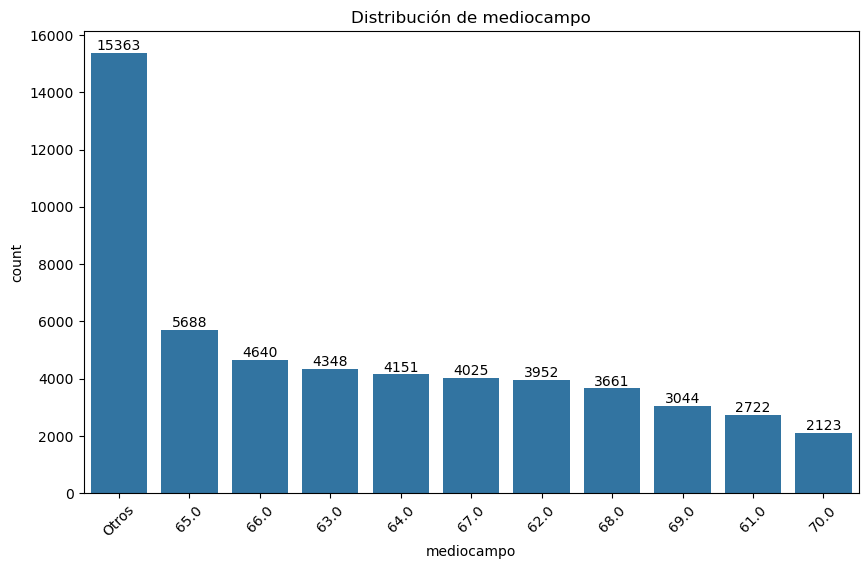

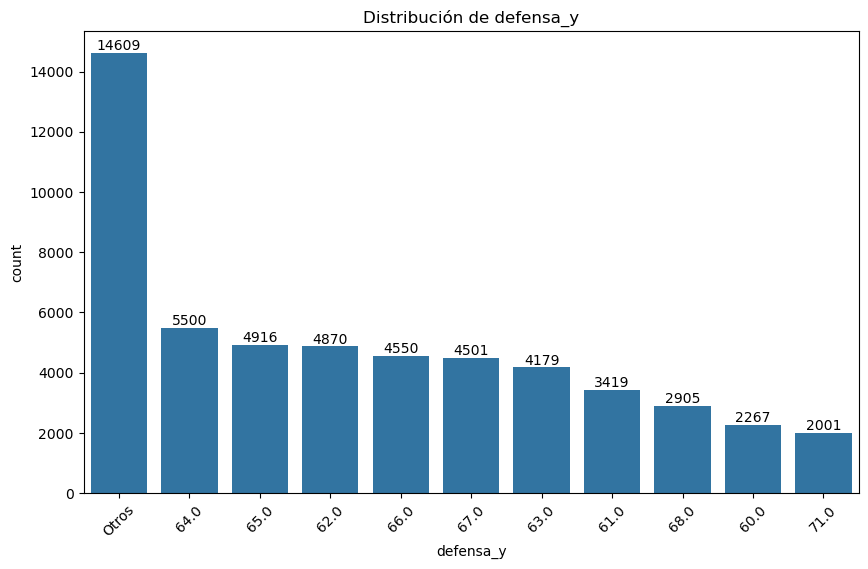

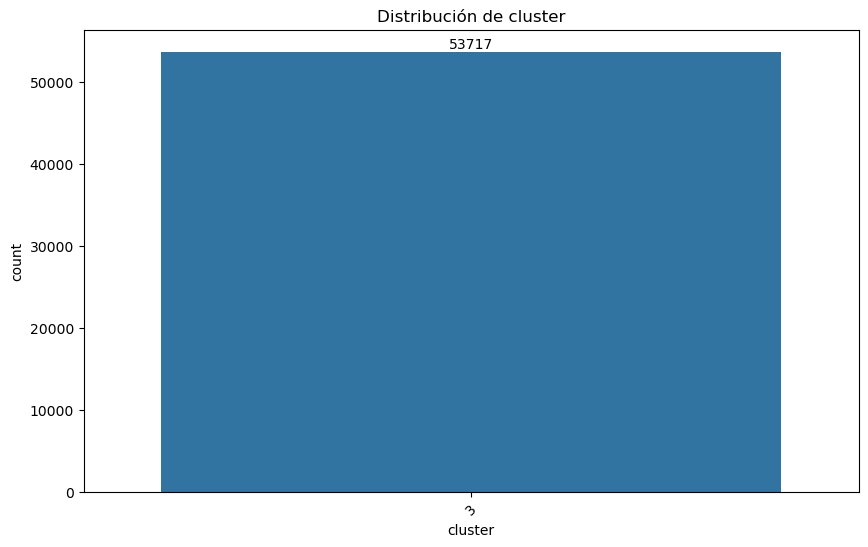

In [12]:
columnas = jugadores_cluster_3.columns  # Obtener todas las columnas del DataFrame

for columna in columnas:
    # Verificar que la columna sea categórica o tenga valores discretos
    if jugadores_cluster_3[columna].dtype == 'object' or jugadores_cluster_3[columna].nunique() < 50:
        # Obtener los valores únicos y sus frecuencias
        conteo = jugadores_cluster_3[columna].value_counts()
        
        # Definir si la columna necesita agrupación o no
        if len(conteo) > 5:
            # Tomar el top 4 y agrupar el resto como "Otros"
            top_4 = conteo.nlargest(10)  # Obtener los 4 valores más frecuentes
            datas_grafico = jugadores_cluster_3[columna].apply(lambda x: x if x in top_4.index else "Otros")
            conteo_agrupado = datas_grafico.value_counts()
        else:
            # Si hay 5 o menos valores únicos, usar los valores tal cual
            conteo_agrupado = conteo
            datas_grafico = jugadores_cluster_3[columna]  # Sin agrupaciones
        
        # Graficar con Seaborn
        plt.figure(figsize=(10, 6))
        ax = sns.countplot(x=datas_grafico, order=conteo_agrupado.index)
        
        # Añadir los valores exactos arriba de cada barra
        for p in ax.patches:
            ax.annotate(f'{int(p.get_height())}', 
                        (p.get_x() + p.get_width() / 2., p.get_height()), 
                        ha='center', va='center', 
                        xytext=(0, 5), textcoords='offset points')
        
        # Título del gráfico
        plt.title(f"Distribución de {columna}")
        plt.xticks(rotation=45)
        plt.show()


## Matriz de correlación data_completa gráficada 

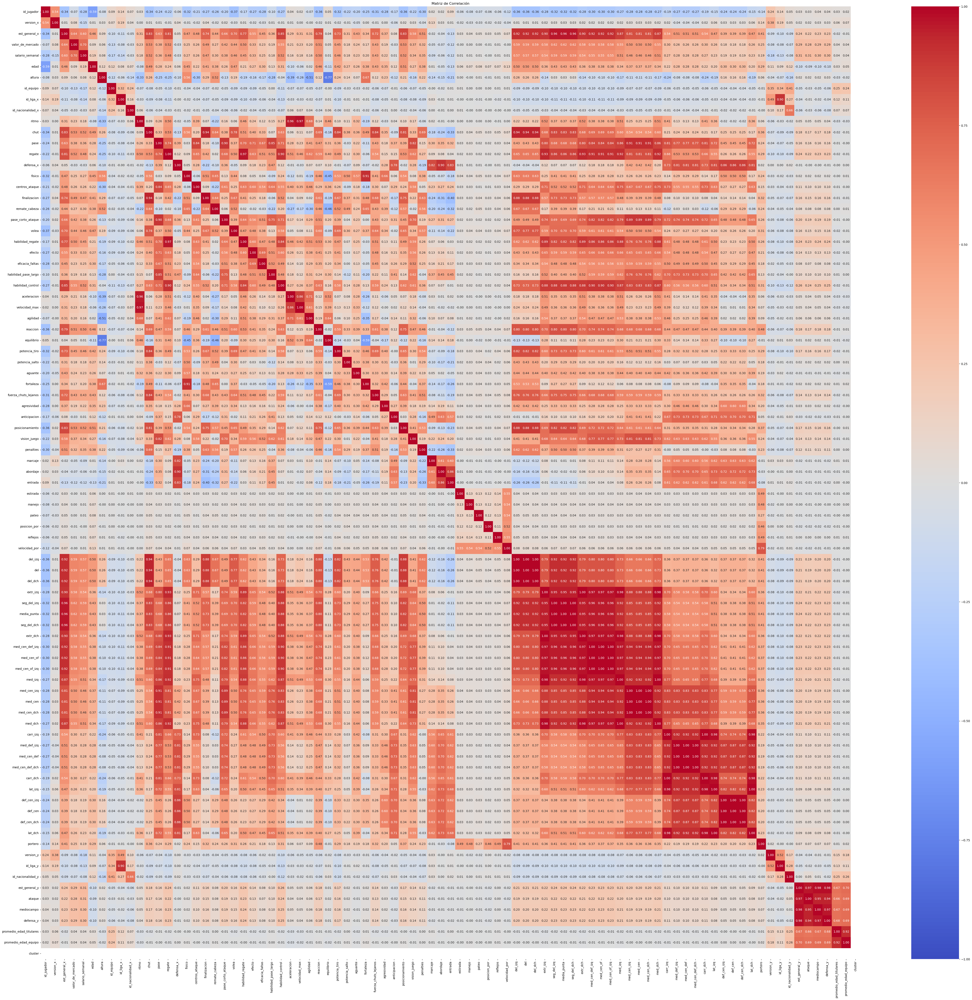

In [14]:
# Seleccionar las columnas numéricas del DataFrame
numericas = jugadores_cluster_3.select_dtypes(include=['float64', 'int64'])

# Calcular la matriz de correlación
correlacion = numericas.corr()

# Visualizar la matriz de correlación con un heatmap
plt.figure(figsize=(62, 58))
sns.heatmap(correlacion, annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1)
plt.title("Matriz de Correlación")
plt.show()


### Columnas a excluir

In [16]:
for i, j in enumerate(data_completa.columns, 1):
    tipo = data_completa[j].dtypes
    print(f'{i} {j:35}: {tipo}')

1 id_jugador                         : int64
2 nombre_jugador                     : object
3 version_x                          : int64
4 posiciones                         : object
5 est_general_x                      : int64
6 valor_de_mercado                   : int64
7 salario_semanal                    : int64
8 edad                               : int64
9 nacimiento                         : object
10 altura                             : int64
11 id_equipo                          : float64
12 nombre_club_x                      : object
13 id_liga_x                          : int64
14 nombre_liga_x                      : object
15 posicion_club                      : object
16 id_nacionalidad_x                  : int64
17 nacionalidad                       : object
18 pierna                             : object
19 ritmo                              : int64
20 chut                               : int64
21 pase                               : int64
22 regate                        

In [17]:
# Identificar columnas irrelevantes para el análisis de patrones de porteros
columnas_excluir = [
    'id_jugador', 'nombre_jugador', 'version_x', 'posiciones', 'id_equipo',
    'nombre_club_x', 'id_liga_x', 'nombre_liga_x', 'posicion_club', 'id_nacionalidad_x',
    'nacionalidad', 'pierna', 'nacimiento', 'categoria', 'nombre_club_y', 
    'version_y', 'id_liga_y', 'nombre_liga_y', 'id_nacionalidad_y', 'nacion_liga',
    # Excluir columnas no relevantes para porteros:
    'ritmo', 'chut', 'pase', 'regate', 'defensa_x', 'fisico', 'centros_ataque',
    'finalizacion', 'remate_cabeza', 'pase_corto_ataque', 'volea', 'habilidad_regate',
    'efecto', 'eficacia_faltas', 'habilidad_pase_largo', 'habilidad_control',
    'aceleracion', 'velocidad_max', 'agilidad', 'reaccion', 'equilibrio',
    'potencia_tiro', 'potencia_salto', 'aguante', 'fortaleza', 'fuerza_chuts_lejanos',
    'agresividad', 'anticipacion', 'posicionamiento', 'vision_juego', 'penalties',
    'marcaje', 'abordaje', 'entrada',
    # Excluir posiciones irrelevantes para porteros:
    'del_izq', 'del', 'del_dch', 'extr_izq', 'seg_del_izq', 'media_punta',
    'seg_del_dch', 'extr_dch', 'med_cen_def_izq', 'med_cen_of', 'med_cen_of_izq',
    'med_izq', 'med_cen_izq', 'med_cen', 'med_cen_dch', 'med_dch', 'carr_izq',
    'med_def_izq', 'med_cen_def', 'med_cen_def_dch', 'carr_dch', 'lat_izq',
    'def_cen_izq', 'def_cen', 'def_cen_dch', 'lat_dch', 'ataque', 'mediocampo', 'defensa_y'
]

### Matriz filtrada

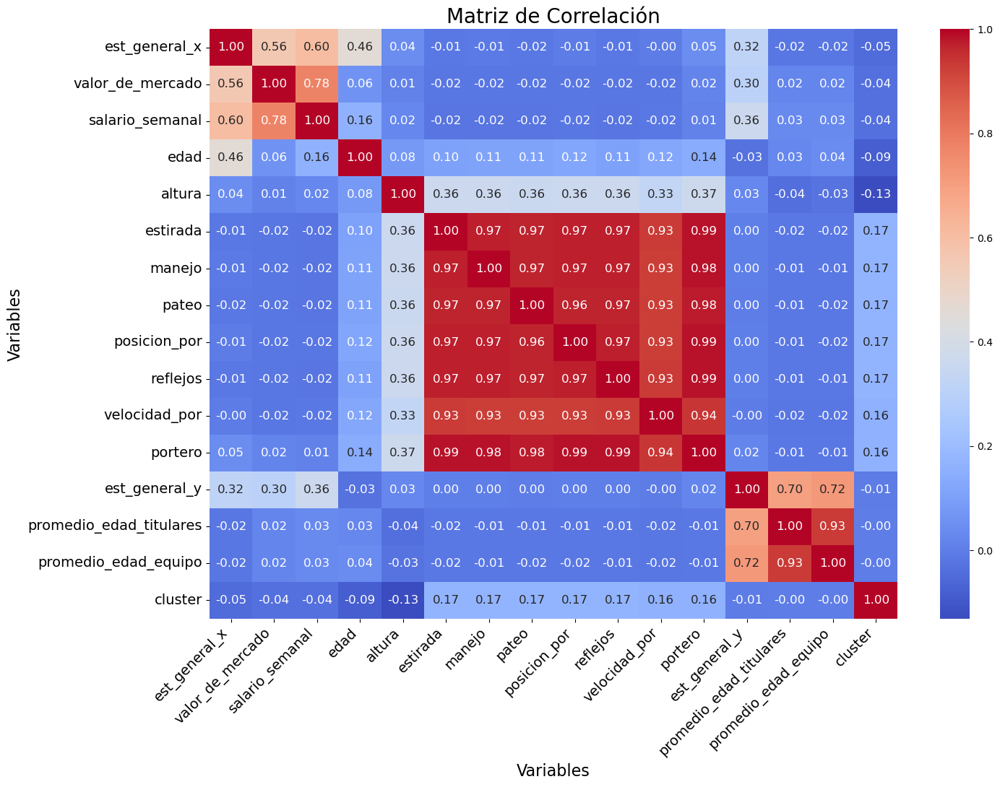

In [19]:
# Filtrar columnas numéricas relevantes
columnas_incluir = [
    col for col in data_completa.columns
    if col not in columnas_excluir and data_completa[col].dtype in ['int64', 'float64']
]

# Crear la matriz de correlación
matriz_correlacion = data_completa[columnas_incluir].corr()

# Visualizar la matriz de correlación con un heatmap
plt.figure(figsize=(15, 11))  # Aumentar el tamaño del gráfico para celdas más grandes
sns.heatmap(
    matriz_correlacion, 
    annot=True,            # Mostrar los números de correlación
    fmt='.2f',             # Formato de los números (dos decimales)
    cmap='coolwarm',       # Colores del heatmap
    cbar=True,             # Mostrar la barra de color
    annot_kws={"size": 12} # Aumentar el tamaño de fuente de los números dentro de las celdas
)

# Personalizar los tamaños de las etiquetas de los ejes
plt.title('Matriz de Correlación', fontsize=20)  # Título más grande
plt.xticks(fontsize=14, rotation=45, ha='right') # Etiquetas del eje X más grandes y rotadas
plt.yticks(fontsize=14, rotation=0)             # Etiquetas del eje Y más grandes y horizontales
plt.xlabel('Variables', fontsize=16)            # Etiqueta del eje X
plt.ylabel('Variables', fontsize=16)            # Etiqueta del eje Y

plt.tight_layout()  # Ajustar márgenes automáticamente
plt.show()


In [20]:
# Convertir la matriz de correlación en un formato más manejable (un DataFrame con índices)
correlaciones = matriz_correlacion.abs()  # Usamos el valor absoluto para considerar tanto correlaciones positivas como negativas

# Eliminar la diagonal (correlaciones de una columna consigo misma)
for col in correlaciones.columns:
    correlaciones[col] = correlaciones[col].drop(col)

# Convertir la matriz en una lista de pares columna-columna con sus valores de correlación
correlaciones_lista = correlaciones.unstack()

# Filtrar las correlaciones duplicadas (columna_1, columna_2 y columna_2, columna_1)
correlaciones_lista = correlaciones_lista[correlaciones_lista < 1]  # Solo considerar las correlaciones entre columnas diferentes
correlaciones_lista = correlaciones_lista.sort_values(ascending=False)  # Ordenar de mayor a menor

# Obtener el top 10 de pares de columnas correlacionadas
top_correlaciones = correlaciones_lista.head(50)

# Imprimir el resultado
print(top_correlaciones)


reflejos                 portero                    0.986304
portero                  reflejos                   0.986304
estirada                 portero                    0.985937
portero                  estirada                   0.985937
                         posicion_por               0.985013
posicion_por             portero                    0.985013
portero                  manejo                     0.984683
manejo                   portero                    0.984683
pateo                    portero                    0.975443
portero                  pateo                      0.975443
reflejos                 estirada                   0.973189
estirada                 reflejos                   0.973189
manejo                   reflejos                   0.969917
reflejos                 manejo                     0.969917
manejo                   estirada                   0.969798
estirada                 manejo                     0.969798
posicion_por            

## Graficas analisis explotario 

### Top 5 

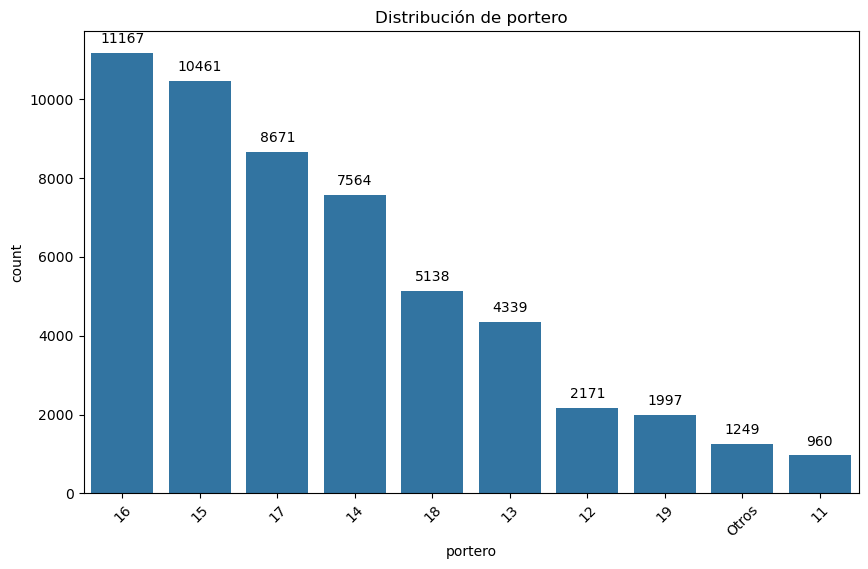

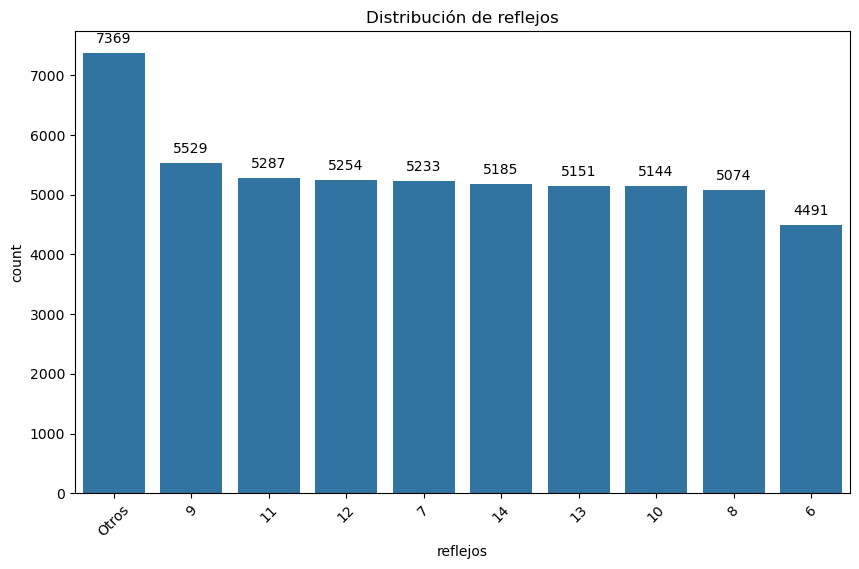

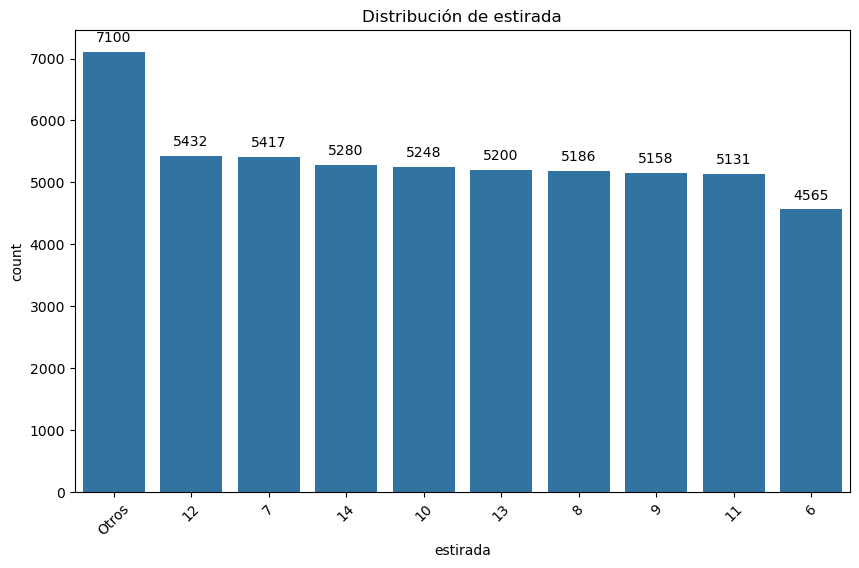

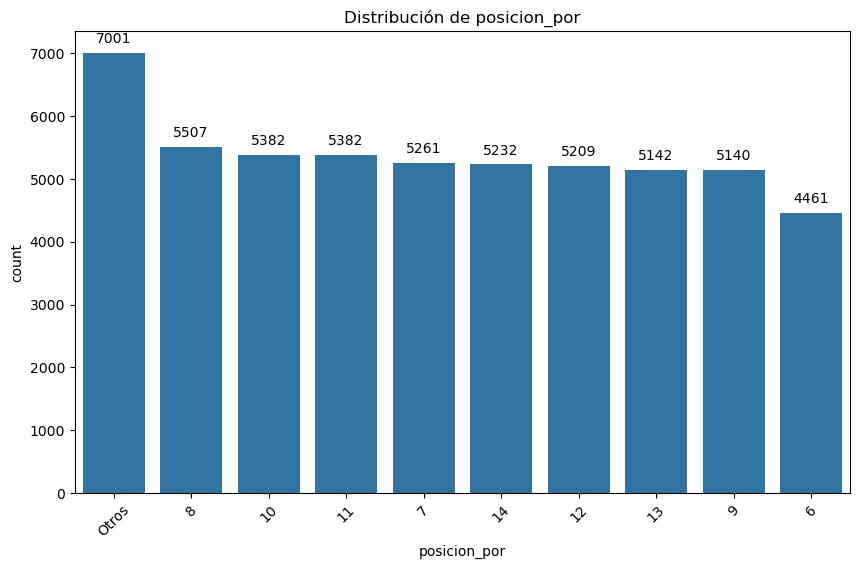

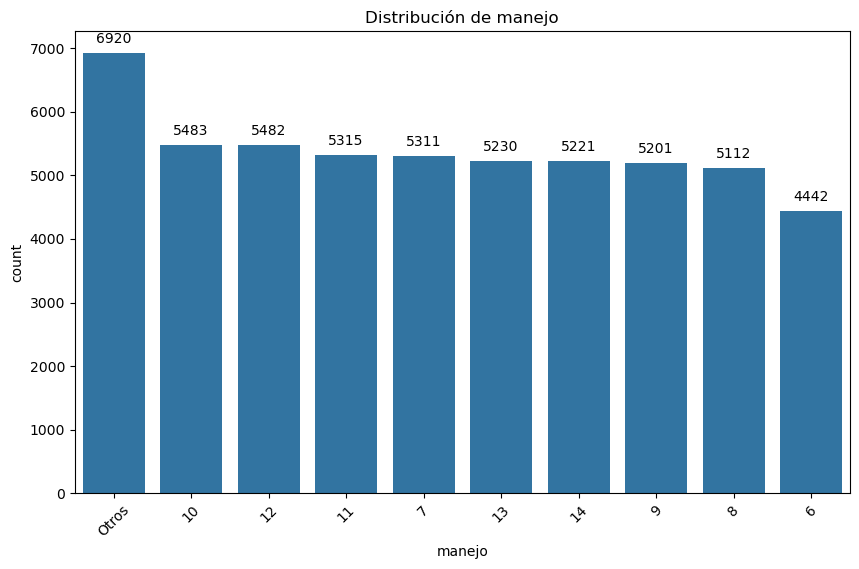

...

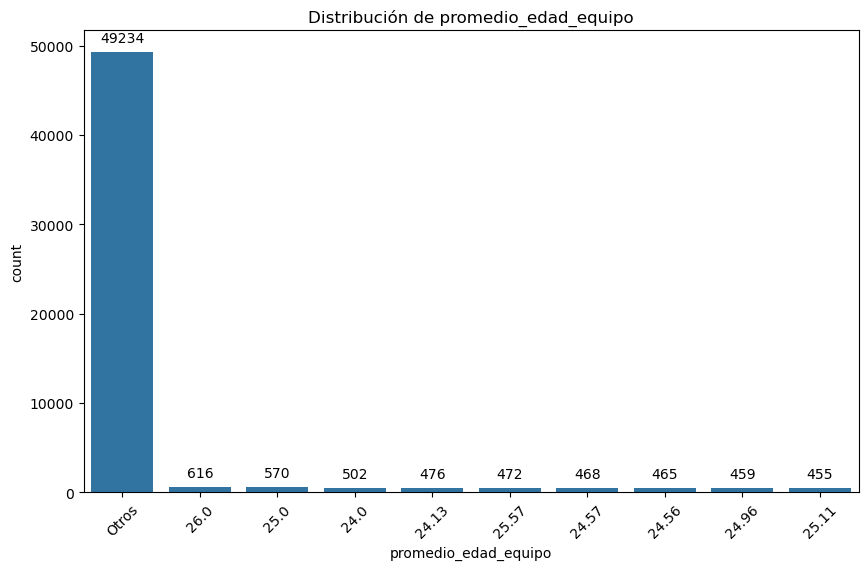

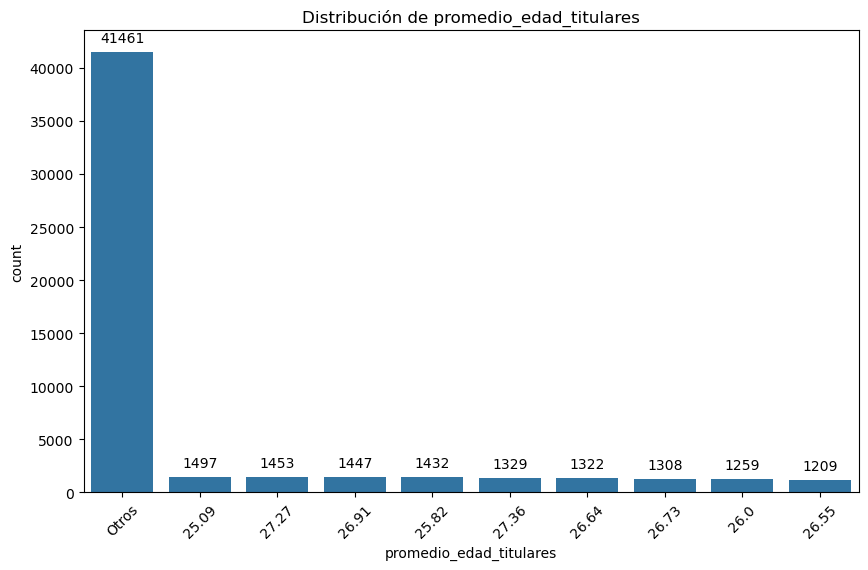

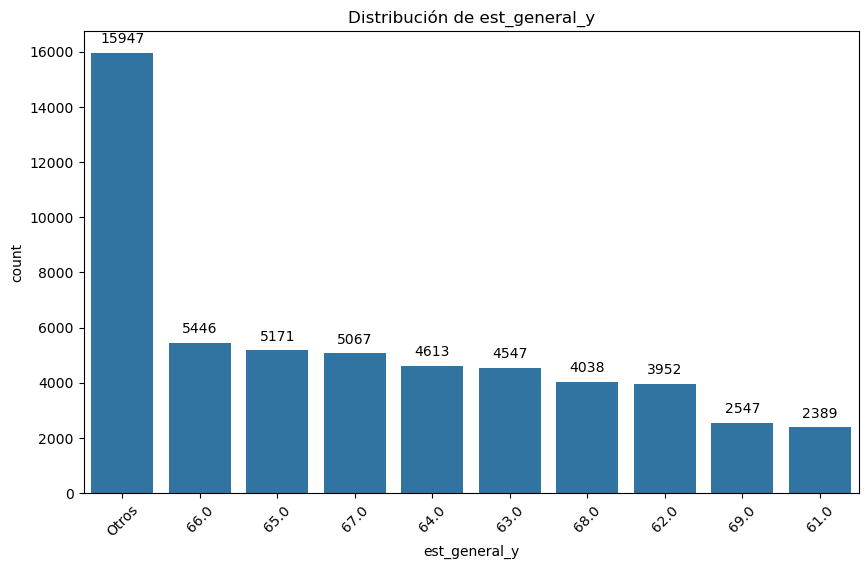

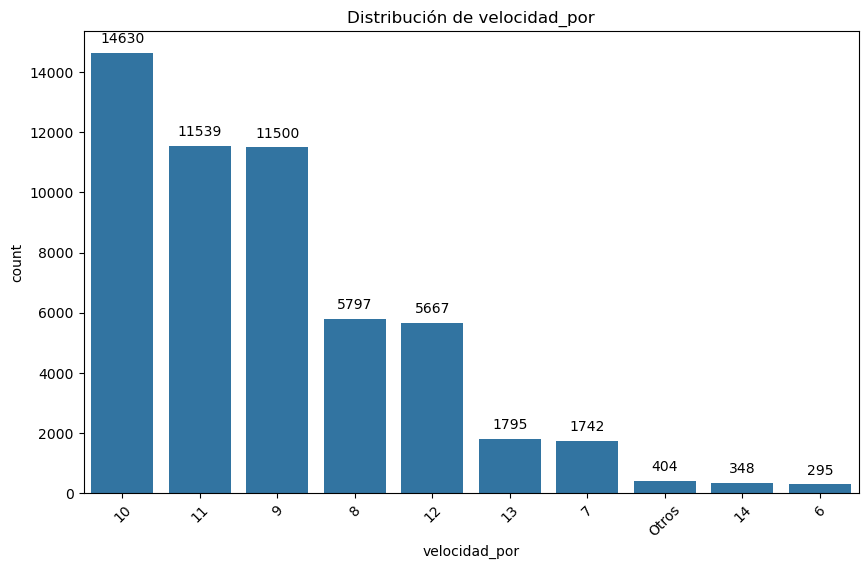

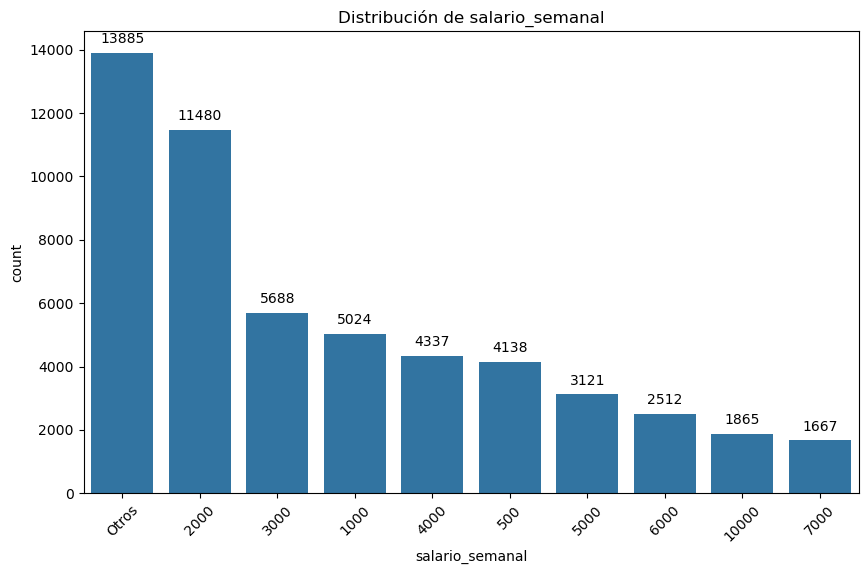

In [22]:
columnas = [
    'portero', 'reflejos', 'estirada', 'posicion_por', 'manejo', 'pateo',
    'promedio_edad_equipo', 'promedio_edad_titulares', 'est_general_y', 'velocidad_por', 'salario_semanal'
]

# Bucle para crear gráficos de cada columna
for columna in columnas:
    # Obtener los valores únicos y sus frecuencias
    conteo = jugadores_cluster_3[columna].value_counts()
    
    # Definir si la columna necesita agrupación o no
    if len(conteo) > 10:
        # Tomar el top 4 y agrupar el resto como "Otros"
        top_9 = conteo.nlargest(9)  # Obtener los 4 valores más frecuentes
        datas_grafico = jugadores_cluster_3[columna].apply(lambda x: x if x in top_9.index else "Otros")
        conteo_agrupado = datas_grafico.value_counts()
    else:
        # Si hay 5 o menos valores únicos, usar los valores tal cual
        conteo_agrupado = conteo
    
    # Graficar con Seaborn
    plt.figure(figsize=(10, 6))
    ax = sns.countplot(x=datas_grafico if len(conteo) > 10 else jugadores_cluster_3[columna], 
                       order=conteo_agrupado.index)
    
    # Añadir los valores exactos arriba de cada barra
    for p in ax.patches:
        ax.annotate(f'{int(p.get_height())}', 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='center', 
                    xytext=(0, 10), textcoords='offset points')
    
    # Título del gráfico
    plt.title(f"Distribución de {columna}")
    plt.xticks(rotation=45)
    plt.show()

###  Top 10

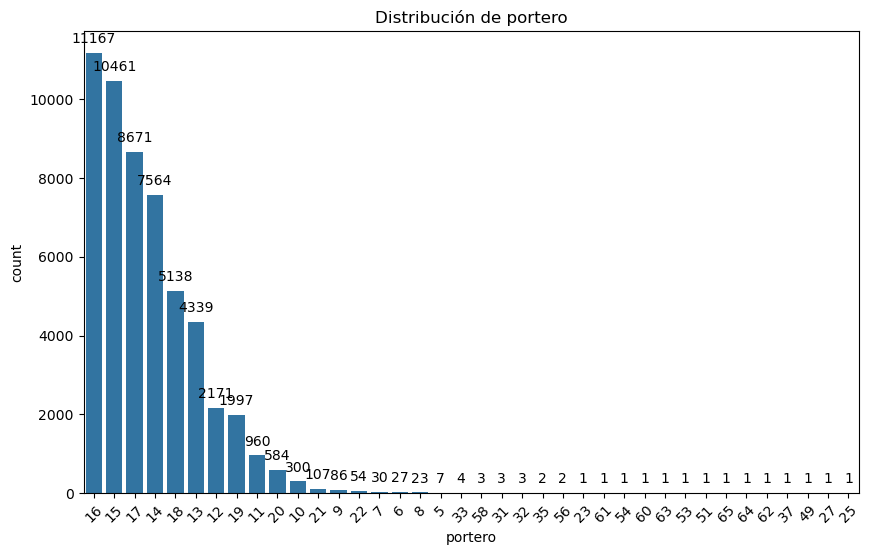

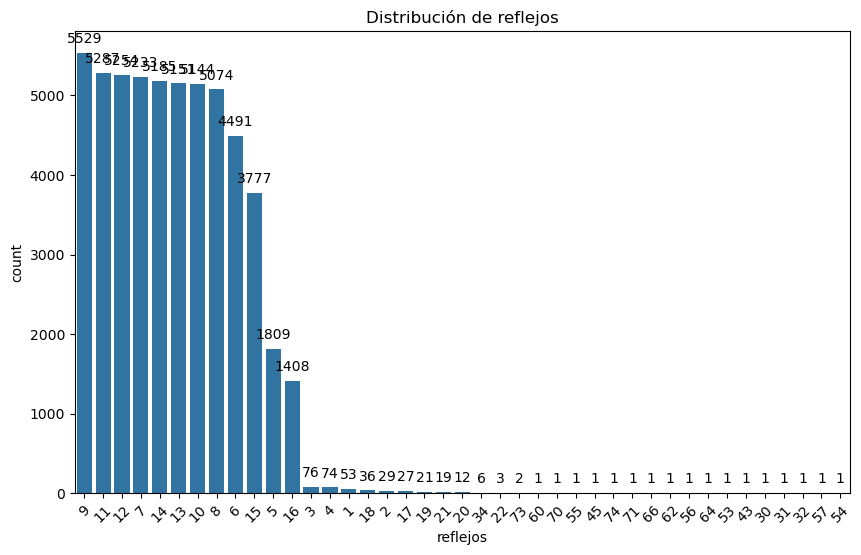

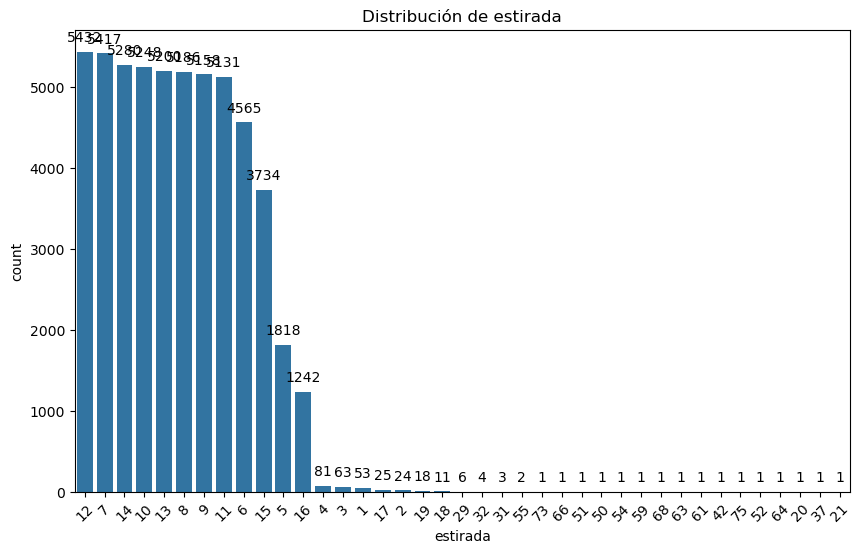

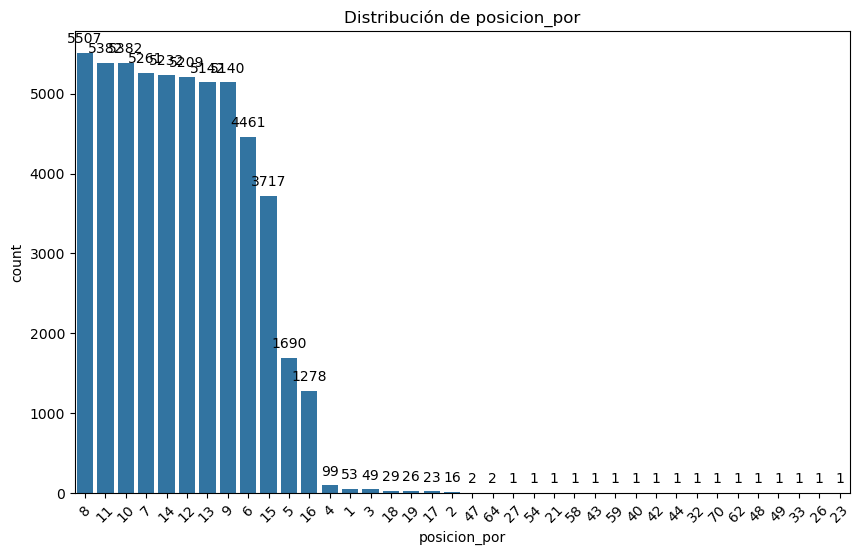

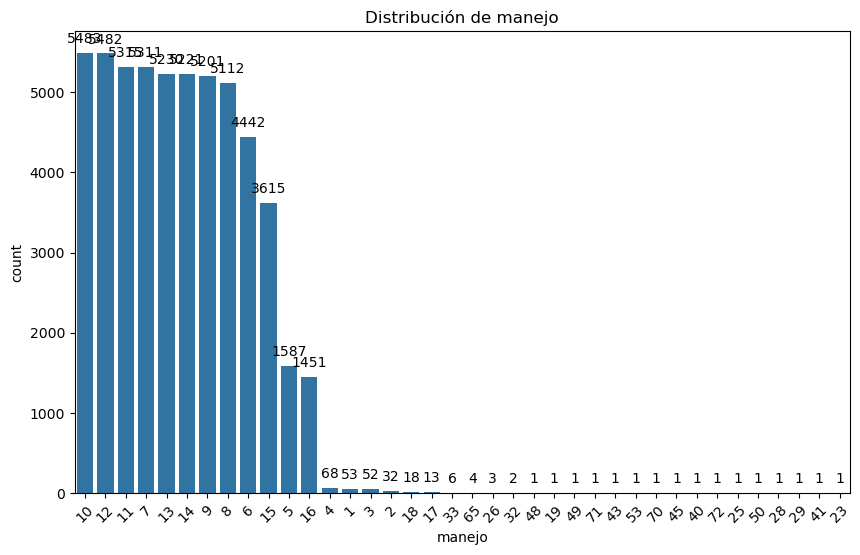

...

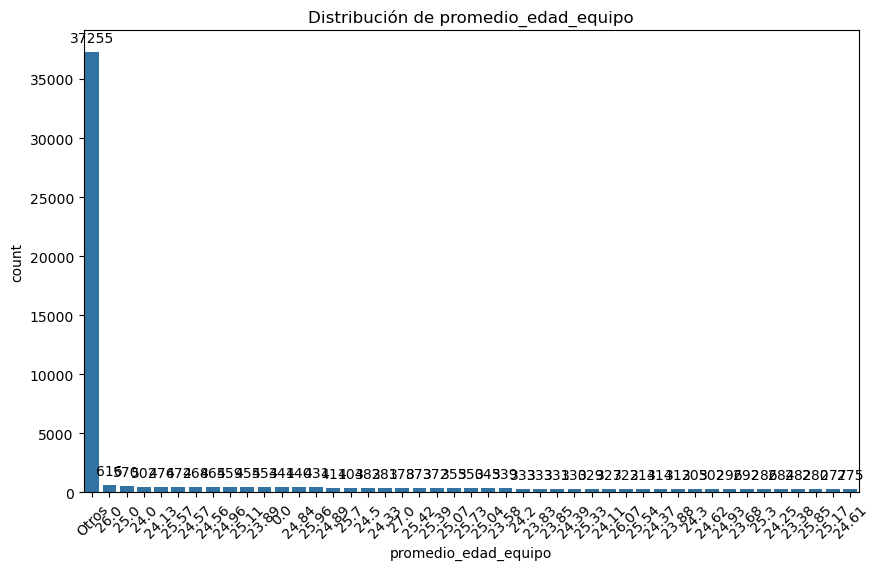

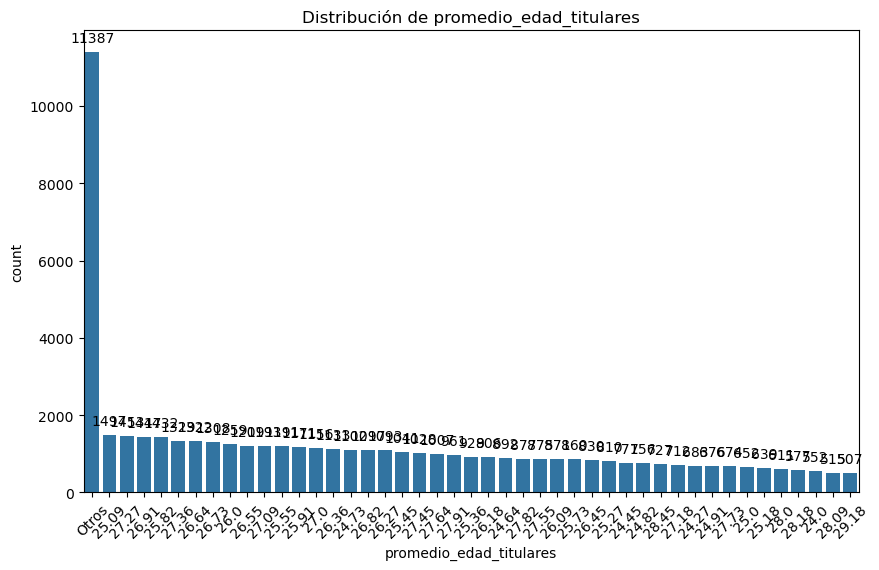

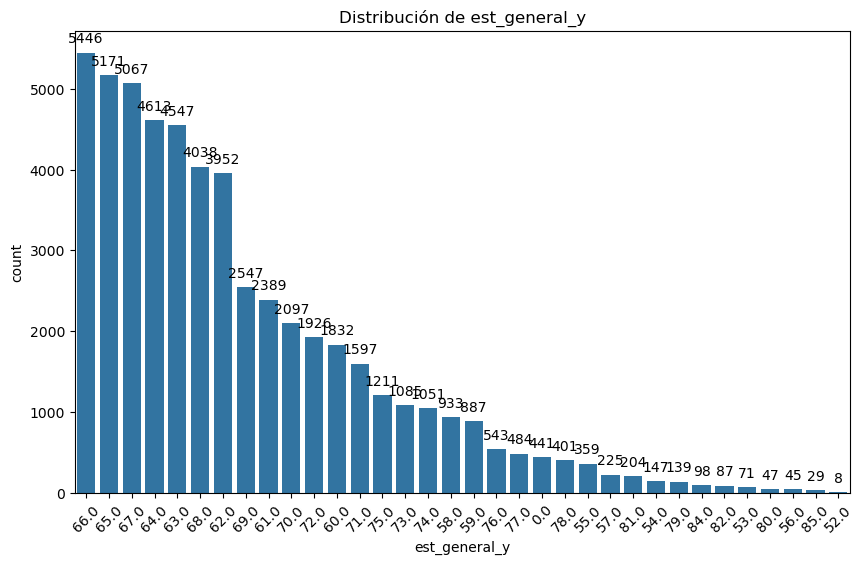

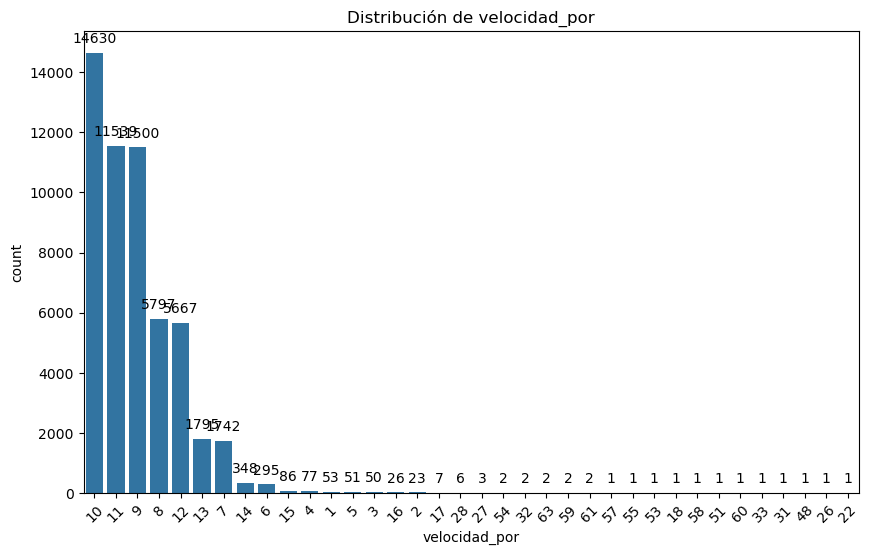

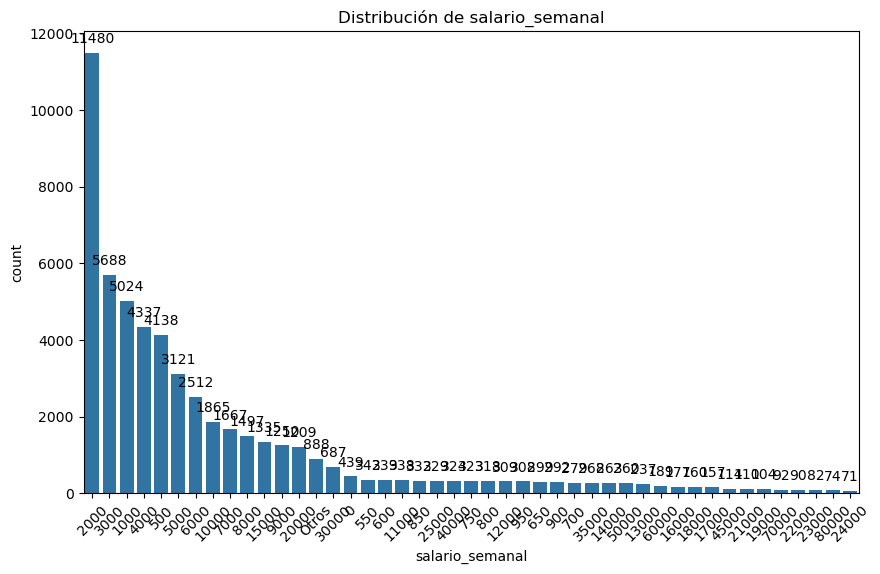

In [24]:
columnas2 = [
    'portero', 'reflejos', 'estirada', 'posicion_por', 'manejo', 'pateo',
    'promedio_edad_equipo', 'promedio_edad_titulares', 'est_general_y', 'velocidad_por', 'salario_semanal'
]

# Bucle para crear gráficos de cada columna
for columna in columnas2:
    # Obtener los valores únicos y sus frecuencias
    conteo = jugadores_cluster_3[columna].value_counts()
    
    # Definir si la columna necesita agrupación o no
    if len(conteo) > 45:
        # Tomar el top 4 y agrupar el resto como "Otros"
        top_44 = conteo.nlargest(44)  # Obtener los 4 valores más frecuentes
        datas_grafico = jugadores_cluster_3[columna].apply(lambda x: x if x in top_44.index else "Otros")
        conteo_agrupado = datas_grafico.value_counts()
    else:
        # Si hay 5 o menos valores únicos, usar los valores tal cual
        conteo_agrupado = conteo
    
    # Graficar con Seaborn
    plt.figure(figsize=(10, 6))
    ax = sns.countplot(x=datas_grafico if len(conteo) > 45 else jugadores_cluster_3[columna], 
                       order=conteo_agrupado.index)
    
    # Añadir los valores exactos arriba de cada barra
    for p in ax.patches:
        ax.annotate(f'{int(p.get_height())}', 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='center', 
                    xytext=(0, 10), textcoords='offset points')
    
    # Título del gráfico
    plt.title(f"Distribución de {columna}")
    plt.xticks(rotation=45)
    plt.show()

## Analisis columnas

### altura

La altura juega un papel crucial, pero no necesariamente deben ser los más altos para ser los mejores. Pros: cobertura de area, movimiento, salto y velocidad, favoreciendo la elección de porteros con esta característica.

In [28]:
# Calcular el promedio de altura por cluster
promedio_altura_por_cluster = data_completa.groupby('cluster')['altura'].mean()

# Encontrar el cluster con la mayor altura promedio
cluster_mayor_altura = promedio_altura_por_cluster.idxmax()
mayor_promedio_altura = promedio_altura_por_cluster.max()

# Mostrar los resultados
print("Promedio de altura por cluster:")
print(promedio_altura_por_cluster)
print(f"\nEl cluster con la mayor altura promedio es: {cluster_mayor_altura} con un promedio de {mayor_promedio_altura:.2f} cm.")


Promedio de altura por cluster:
cluster
0    182.964100
1    179.289325
2    188.288931
3    179.029041
Name: altura, dtype: float64

El cluster con la mayor altura promedio es: 2 con un promedio de 188.29 cm.


/var/folders/cz/p2v7np113bv8lmvh4y3xdwtc0000gn/T/ipykernel_12046/2441224684.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax1 = sns.barplot(
/var/folders/cz/p2v7np113bv8lmvh4y3xdwtc0000gn/T/ipykernel_12046/2441224684.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels([etiquetas_cluster[cluster] for cluster in promedios_altura_por_cluster['cluster']])


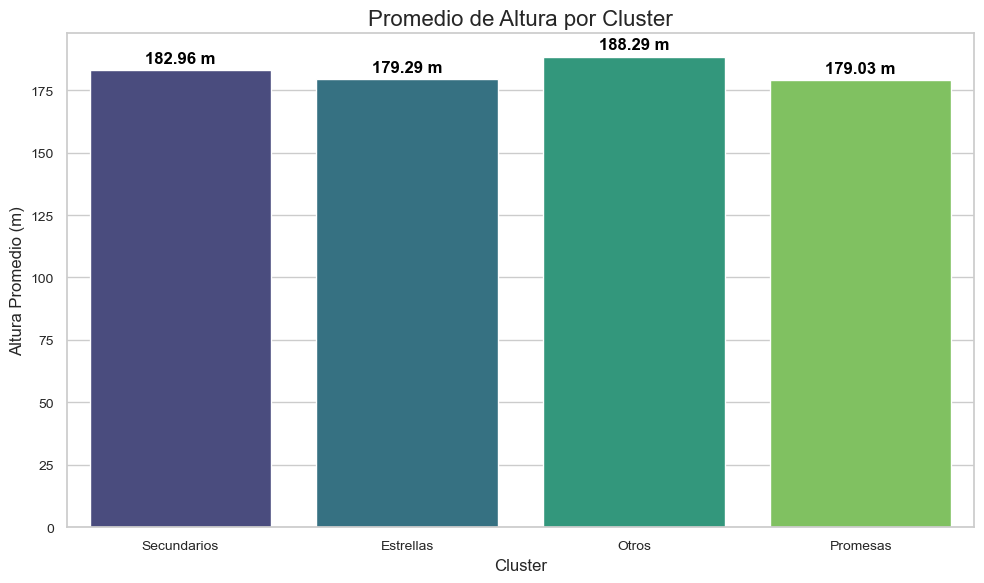

In [29]:
# Diccionario para renombrar los valores del eje x
etiquetas_cluster = {
    0: 'Secundarios',
    1: 'Estrellas',
    2: 'Otros',
    3: 'Promesas'
}

# Configurar estilo
sns.set_theme(style="whitegrid")

# Calcular promedio de alturas por cluster
promedios_altura_por_cluster = data_completa.groupby('cluster')['altura'].mean().reset_index()

# --- GRÁFICO 1: Promedio de altura por cluster ---
plt.figure(figsize=(10, 6))
ax1 = sns.barplot(
    data=promedios_altura_por_cluster,
    x='cluster',
    y='altura',
    palette="viridis"
)

# Renombrar las etiquetas del eje x
ax1.set_xticklabels([etiquetas_cluster[cluster] for cluster in promedios_altura_por_cluster['cluster']])

# Añadir valores formateados sobre las barras
for i, bar in enumerate(ax1.patches):
    bar_value = bar.get_height()
    ax1.text(
        bar.get_x() + bar.get_width() / 2,  # Posición horizontal
        bar_value + (bar_value * 0.01),    # Posición vertical (ligeramente arriba de la barra)
        f"{bar_value:.2f} m",              # Valor formateado en metros con 2 decimales
        ha='center', va='bottom', fontsize=12, color='black', fontweight='bold'
    )

# Etiquetas y título
plt.title("Promedio de Altura por Cluster", fontsize=16)
plt.xlabel("Cluster", fontsize=12)
plt.ylabel("Altura Promedio (m)", fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Mostrar el gráfico
plt.tight_layout()
plt.show()


/var/folders/cz/p2v7np113bv8lmvh4y3xdwtc0000gn/T/ipykernel_12046/1351219111.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap("viridis", len(patches))  # Cargar paleta viridis


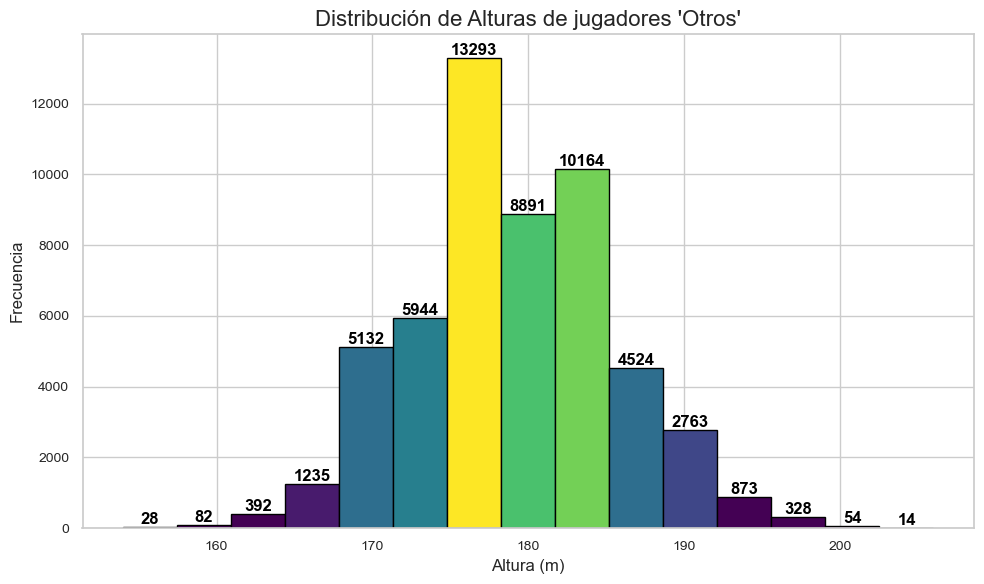

In [30]:
# Filtrar datos para cluster 3
jugadores_cluster_3 = data_completa[data_completa['cluster'] == 3]

plt.figure(figsize=(10, 6))

# Crear histograma sin colores
n, bins, patches = plt.hist(
    jugadores_cluster_3['altura'], bins=15, color='royalblue', edgecolor='black'
)

# Aplicar paleta viridis
norm = Normalize(vmin=min(n), vmax=max(n))  # Normalizar frecuencia para mapear colores
viridis = plt.cm.get_cmap("viridis", len(patches))  # Cargar paleta viridis

for i, patch in enumerate(patches):
    patch.set_facecolor(viridis(norm(n[i])))  # Asignar color basado en la frecuencia

# Añadir valores sobre las barras
for i in range(len(patches)):
    bar_value = int(n[i])  # Frecuencia (altura de la barra)
    if bar_value > 0:  # Solo si la barra tiene valor
        plt.text(
            (bins[i] + bins[i + 1]) / 2,  # Posición horizontal (centro del bin)
            bar_value + 0.5,              # Posición vertical (ligeramente arriba de la barra)
            f"{bar_value}",               # Valor formateado como entero
            ha='center', va='bottom', fontsize=12, color='black', fontweight='bold'
        )

# Etiquetas y título
plt.title("Distribución de Alturas de jugadores 'Otros'", fontsize=16)
plt.xlabel("Altura (m)", fontsize=12)
plt.ylabel("Frecuencia", fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Mostrar el gráfico
plt.tight_layout()
plt.show()

### edad

La edad de los jugadores_cluster_3 oscila, la más común es 21 años:
Los jugadores jóvenes son populares entre los usuarios de FIFA porque pueden mejorar rápidamente en estadísticas. Esto fomenta su inclusión en la base de datos y su frecuencia en el juego.

top 9 es 28 años: madurez y mejor rendimiento.
top 10 es 19 años: jóvenes promesas con alto potencial.

In [33]:
# Encontrar al jugador con la mayor edad
jugador_mayor = jugadores_cluster_3.loc[jugadores_cluster_3['edad'].idxmax()]
print(jugador_mayor[['nombre_jugador', 'edad', 'est_general_x', 'id_jugador']])

nombre_jugador    Kazuyoshi Miura
edad                           54
est_general_x                  59
id_jugador                 254704
Name: 138668, dtype: object


### est_general y trayectoria Jan Oblak

In [35]:
# Filtrar los datos para las versiones desde 2015 hasta 2024
jugadores_versiones = data_completa[(data_completa['version_x'] >= 2015) & (data_completa['version_x'] <= 2024)]

# Obtener los nombres únicos de los jugadores en ese rango de versiones
nombres_jugadores = jugadores_versiones['nombre_jugador'].unique()

# Mostrar los nombres de los jugadores
print("Jugadores que aparecen entre 2015 y 2024:")
print(nombres_jugadores)

Jugadores que aparecen entre 2015 y 2024:
['Giovanni Pasquale' 'Romain Rocchi' 'Joe Cole' ... 'Rodrigo Frutos'
 'Christian Bos' 'Shahruddin Magomedaliyev']


In [36]:
jugadores_cluster_3.groupby(["id_jugador","nombre_jugador"]).size().sort_values(ascending=False)

id_jugador  nombre_jugador  
219216      Josh Windass        10
214876      Jack Marriott       10
176733      Marcus Berg         10
205887      Cauley Woodrow      10
215195      Sander Svendsen     10
                                ..
233501      Michel Cardenas      1
233528      Khius Metz           1
233546      Yanis Karabelyov     1
233547      Toni Tasev           1
278138      Josh Keyes           1
Length: 21254, dtype: int64

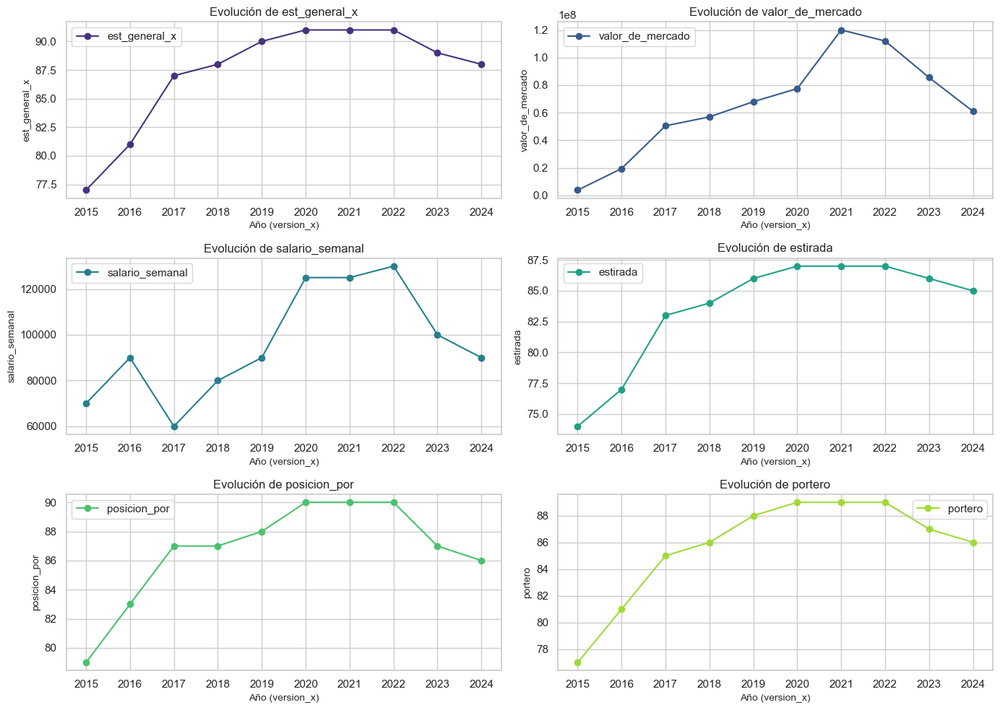

In [52]:
# Filtrar los datos para el jugador "Jan Oblak"
oblak_data = data_completa[data_completa['nombre_jugador'] == 'Jan Oblak']

# Seleccionar las columnas relevantes
portero = oblak_data[['version_x', 'est_general_x', 'valor_de_mercado', 
                      'salario_semanal', 'estirada', 'posicion_por',"portero"]]

# Definir las métricas a graficar (sin 'edad' porque parece no existir)
metricas = ['est_general_x', 'valor_de_mercado', 'salario_semanal', 'estirada','posicion_por',"portero"]

# Crear un gráfico para cada métrica
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(14, 10))  # Ajustar número de filas/columnas según métricas
axes = axes.flatten()  # Convertimos la matriz de ejes en una lista para iterar

# Definir la paleta de colores 'Viridis' para las métricas
viridis_palette = sns.color_palette("viridis", n_colors=len(metricas))

for i, col in enumerate(metricas):
    axes[i].plot(portero['version_x'], portero[col], marker='o', label=col, color=viridis_palette[i])
    axes[i].set_title(f"Evolución de {col}", fontsize=12)
    axes[i].set_xlabel("Año (version_x)", fontsize=10)
    axes[i].set_ylabel(col, fontsize=10)
    axes[i].set_xticks(range(2015, 2025))  # Asegurar que el eje x muestre años completos
    axes[i].grid(True)
    axes[i].legend()

# Si sobran subgráficos, los ocultamos
for j in range(len(metricas), len(axes)):
    axes[j].set_visible(False)

# Ajustar espacio entre gráficos
plt.tight_layout()

# Mostrar el gráfico
plt.show()


### version 

Pico de mayor cantidad de jugadores en 2022, posterior a esto ha ido descendiendo 

-Posible razones incremento:
*Entre 2015 y 2022, la franquicia FIFA pudo haber aumentado el número de equipos y jugadores registrados en su base de datos. Esto incluiría clubes menores, ligas secundarias, y equipos con porteros suplentes y juveniles que anteriormente no se registraban. *Los juegos de FIFA han evolucionado para dar mayor peso a los porteros en términos de estadísticas y habilidades. Esto incluye habilidades específicas como reflejos, manejo del balón, o juego con los pies, alineándose con tendencias reales en el fútbol moderno.

-Posibles razones disminucion:
*Optimización y eliminación de jugadores inactivos:
Desde 2022, puede haber ocurrido una depuración de porteros en la base de datos debido a jugadores retirados, inactivos, o con poca relevancia competitiva. Esto es común en videojuegos como FIFA, donde los datos se actualizan para reflejar el estado actual de las plantillas y ligas.
Łukasz Fabiański (West Ham United, 2022)
Samir Handanovič (Inter de Milán, 2022)
Salvatore Sirigu (Genoa, 2022)
Sergio Romero (Venezia FC, 2022)
Guillermo Ochoa (Club América, 2022)
Igor Akinfeev (CSKA Moscú, 2022)



*Licencias y cobertura de ligas:
Si EA Sports perdió licencias para algunas ligas o equipos entre 2022 y 2024, la cantidad de jugadores registrados, incluidos porteros, también se reduciría.EA Sports terminó su asociación con FIFA en 2023, dando lugar al nuevo nombre "EA Sports FC". Este cambio puede haber afectado las actualizaciones y licencias durante la transición
Tambien:

Liga Brasileña (Brasileirão):
Desde FIFA 21, EA Sports no cuenta con la licencia oficial de esta liga, lo que resultó en la exclusión de jugadores brasileños relevantes. Esto se mantuvo en FIFA 22 y posteriores​
TYC SPORTS

Selección Rusa y clubes rusos:
A raíz del conflicto entre Rusia y Ucrania, EA eliminó todos los equipos y jugadores rusos de FIFA 22 y FIFA 23 como decisión política y ética​


### pierna

La tendencia notable y marcada hacia la "pierna derecha" en la columna "pierna" de tu conjunto de datos puede tener varias explicaciones relacionadas con el fútbol en general y, específicamente, con los porteros.

1. Preferencia natural y biológica: Lado dominante y estilo de juego
2. Posicionamiento y estilo de los porteros: Porteros diestros: Esto tiene que ver con la biomecánica del cuerpo humano, ya que la mayoría de los porteros se sienten más cómodos utilizando la pierna derecha para despejar balones, incluso si su otra pierna (izquierda) es utilizada para posicionarse y moverse de manera más equilibrada en el área.


La tendencia a "pierna derecha" en la columna puede explicarse principalmente por la mayor prevalencia de futbolistas diestros en el mundo. Este patrón también tiene sentido en el contexto de los porteros, ya que la mayoría de ellos son diestros, lo que influye en la distribución de las piernas dominantes dentro de tu base de datos.

### Relacion nombre_club, nombre_liga, nacionalidad y id_nacionalidad

La nacionadalidad mas común: inglesa, asi como los clubes con mas jugadores_cluster_3 son: West Bromwich Albion, Chievo y Stoke City (Estos clubes tengan una gran cantidad de jugadores en tu base de datos porque están asociados a equipos con una rotación más alta o jugadores que fueron prestados entre temporadas) y al mismo tiempo la liga más común es Premier League.

-Desarrollo de talento local: El fútbol inglés ha invertido fuertemente en el desarrollo de su cantera, lo que se refleja en la proporción de jugadores ingleses en clubes de la Premier League.


In [80]:
# Obtener valores únicos de id_nacionalidad_x y nacionalidad
valores_unicos = jugadores_cluster_3[['id_nacionalidad_x', 'nacionalidad']].drop_duplicates()

# Contar el número de jugadores por nacionalidad
conteo_nacionalidad = jugadores_cluster_3.groupby('nacionalidad').size().reset_index(name='total_jugadores')

# Unir los valores únicos con el conteo de jugadores
valores_con_conteo = pd.merge(valores_unicos, conteo_nacionalidad, on='nacionalidad')

# Ordenar por id_nacionalidad_x
valores_con_conteo = valores_con_conteo.sort_values(by='id_nacionalidad_x')

# Imprimir los valores únicos con el conteo de jugadores
for _, row in valores_con_conteo.iterrows():
    print(f"ID Nacionalidad: {row['id_nacionalidad_x']}, Nacionalidad: {row['nacionalidad']}, Total Jugadores: {row['total_jugadores']}")


ID Nacionalidad: 1, Nacionalidad: Albania, Total Jugadores: 150
ID Nacionalidad: 3, Nacionalidad: Armenia, Total Jugadores: 46
ID Nacionalidad: 4, Nacionalidad: Austria, Total Jugadores: 773
ID Nacionalidad: 5, Nacionalidad: Azerbaiyan, Total Jugadores: 33
ID Nacionalidad: 6, Nacionalidad: Bielorrusia, Total Jugadores: 21
ID Nacionalidad: 7, Nacionalidad: Belgica, Total Jugadores: 740
ID Nacionalidad: 8, Nacionalidad: Bosnia y Herzegovina, Total Jugadores: 152
ID Nacionalidad: 9, Nacionalidad: Bulgaria, Total Jugadores: 88
ID Nacionalidad: 10, Nacionalidad: Croacia, Total Jugadores: 301
ID Nacionalidad: 11, Nacionalidad: Chipre, Total Jugadores: 39
ID Nacionalidad: 12, Nacionalidad: Republica Checa, Total Jugadores: 180
ID Nacionalidad: 13, Nacionalidad: Dinamarca, Total Jugadores: 905
ID Nacionalidad: 14, Nacionalidad: Inglaterra, Total Jugadores: 5372
ID Nacionalidad: 15, Nacionalidad: Montenegro, Total Jugadores: 92
ID Nacionalidad: 16, Nacionalidad: Islas Feroe, Total Jugadores: 16

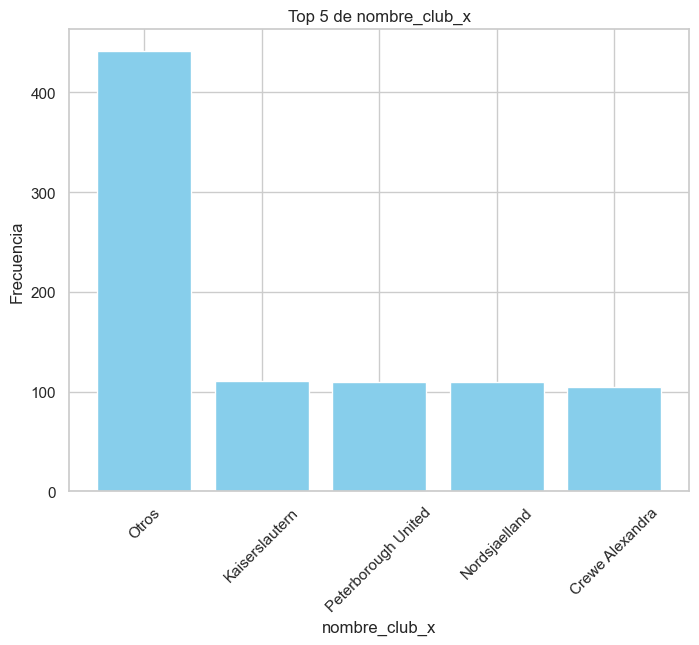

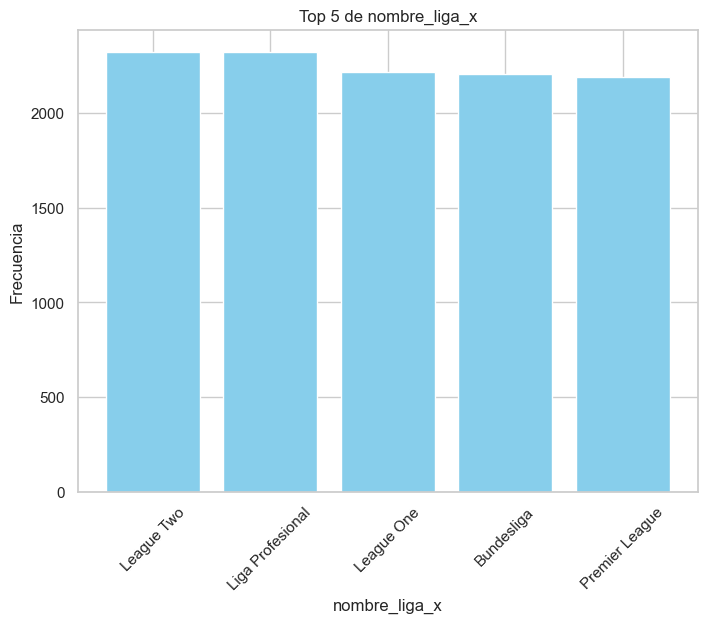

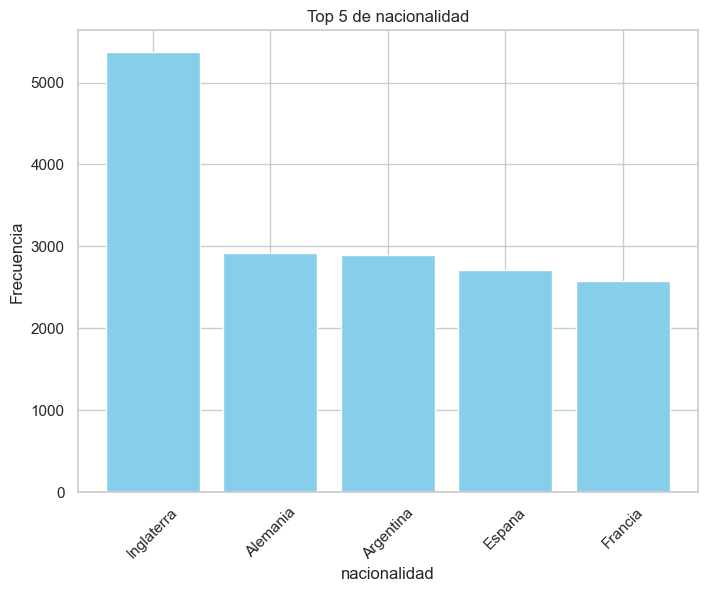

In [82]:
# Crear una lista con las columnas de interés
columnas = ['nombre_club_x','nombre_liga_x','nacionalidad']

# Iterar sobre cada columna para graficar
for columna in columnas:
    # Contar los 5 valores más comunes
    top_5 = jugadores_cluster_3[columna].value_counts().head(5)
    
    # Crear un nuevo gráfico para cada columna
    plt.figure(figsize=(8, 6))
    plt.bar(top_5.index, top_5.values, color='skyblue')
    plt.title(f'Top 5 de {columna}')
    plt.xlabel(columna)
    plt.ylabel('Frecuencia')
    plt.xticks(rotation=45)
    
    # Mostrar el gráfico por separado
    plt.show()

In [84]:
# Contar la cantidad de veces que se repite cada valor en la columna 'nombre_club_x'
conteo_clubes = jugadores_cluster_3['nombre_club_x'].value_counts()

# Iterar e imprimir cada valor único junto con su cantidad de repeticiones
for club, count in conteo_clubes.items():
    print(f"'{club}': {count} veces")


'Otros': 441 veces
'Kaiserslautern': 111 veces
'Peterborough United': 110 veces
'Nordsjaelland': 110 veces
'Crewe Alexandra': 105 veces
'Exeter City': 104 veces
'River Plate': 104 veces
'Al Taawon': 104 veces
'Colchester United': 103 veces
'SpVgg Greuther Furth': 103 veces
'Bradford City': 103 veces
'Huddersfield Town': 103 veces
'Fleetwood Town': 102 veces
'Al Raed': 102 veces
'Morecambe': 102 veces
'Blackpool': 102 veces
'Barnsley': 101 veces
'Cardiff City': 100 veces
'Austria Wien': 100 veces
'St Patrick's': 100 veces
'Cambridge United': 100 veces
'Oxford United': 100 veces
'Crawley Town': 100 veces
'Coventry City': 100 veces
'Universidad Catolica': 99 veces
'Godoy Cruz': 99 veces
'Piast Gliwice': 99 veces
'Angers SCO': 99 veces
'Union Santa Fe': 99 veces
'St. Gallen': 98 veces
'Pohang Steelers': 98 veces
'Nurnberg': 98 veces
'Hannover 96': 98 veces
'Newport County': 97 veces
'Southampton': 97 veces
'Walsall': 97 veces
'Shrewsbury Town': 97 veces
'Swindon Town': 97 veces
'Metz': 97 

### Desde chut hasta pateo

La observación de que las columnas relacionadas con las habilidades técnicas y físicas de los jugadorestienen valores muy bajos para los jugadores del cluster 3 en comparación con los jugadores de campo, es bastante esperada y puede explicarse por varios factores.


Se hace evidente que sus atributos físicos y técnicos en áreas que no tienen que ver con su rol son irrelevantes, y esto se refleja en sus valores bajos en comparación con los jugadores de campo. Esto también muestra la diferencia significativa entre las demandas físicas y técnicas para los porteros frente a los jugadores de campo.

Un dato interesante podría ser que, si se eliminan los porteros del conjunto de datos, las estadísticas de habilidades como regate, pase, finalización, etc., aumentarían notablemente, lo que resalta la diferencia fundamental entre las posiciones. 

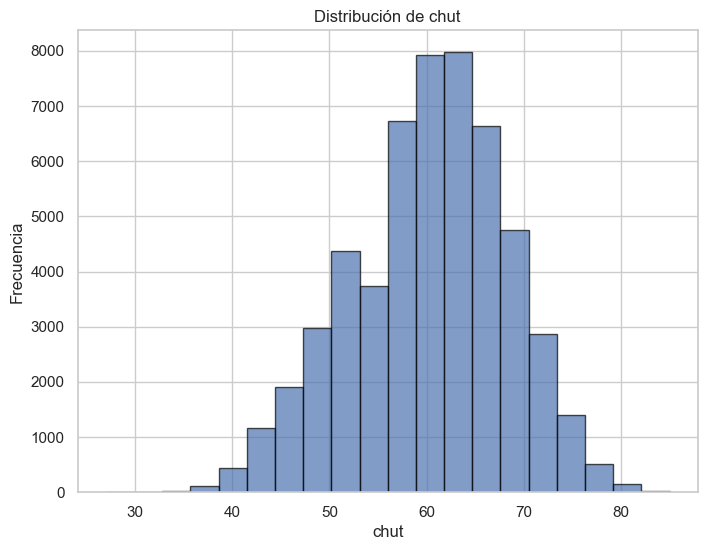

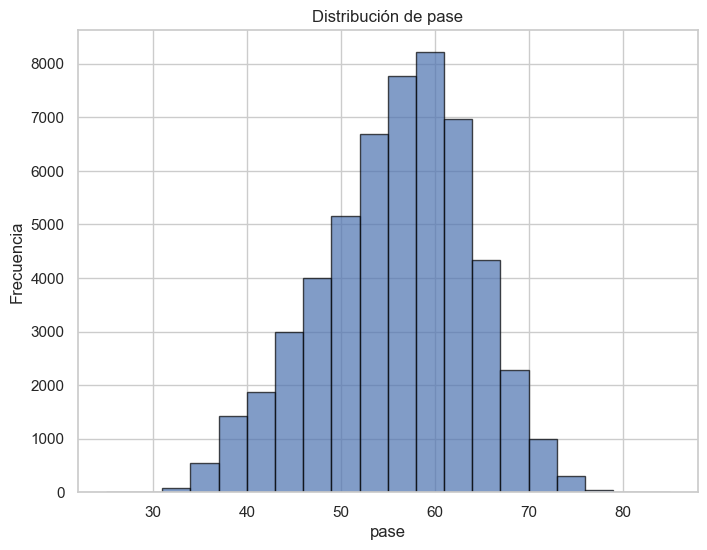

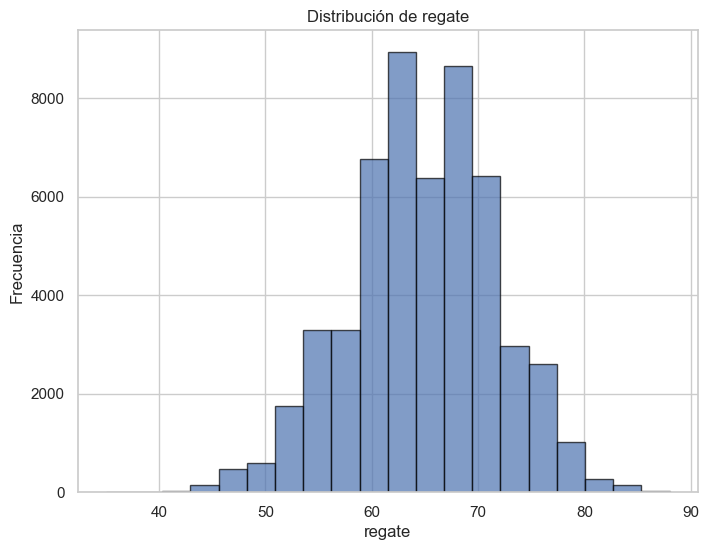

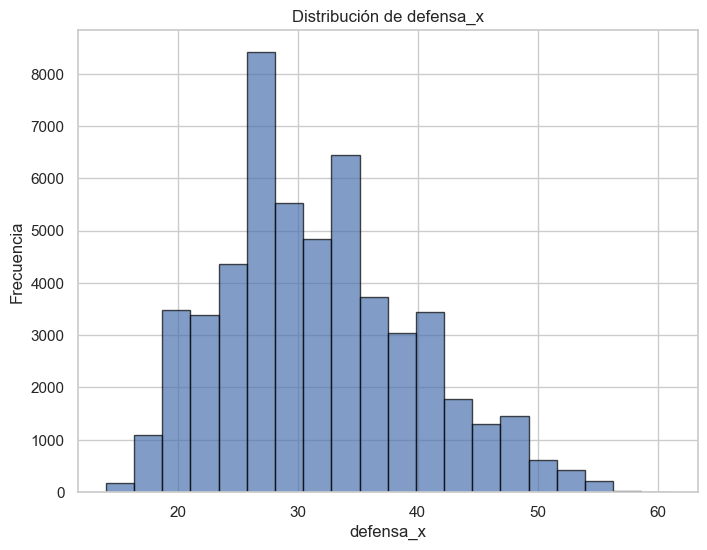

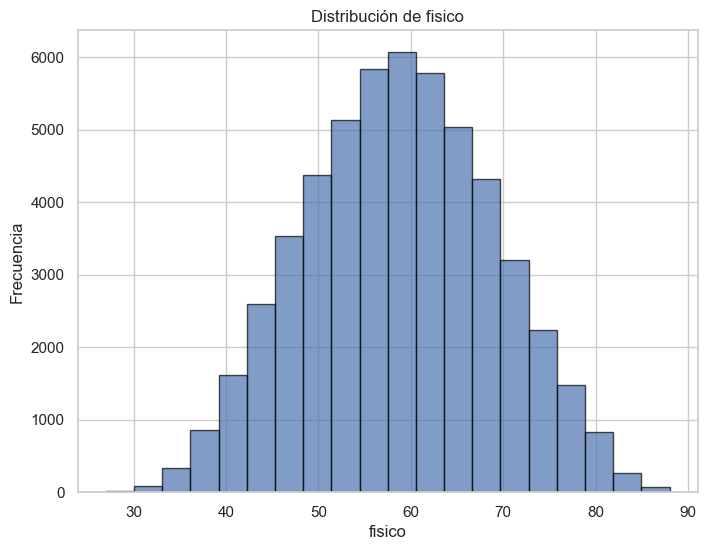

...

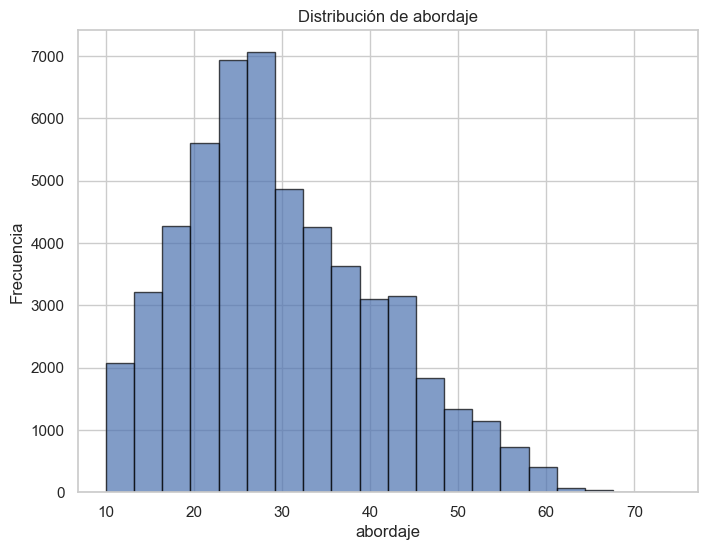

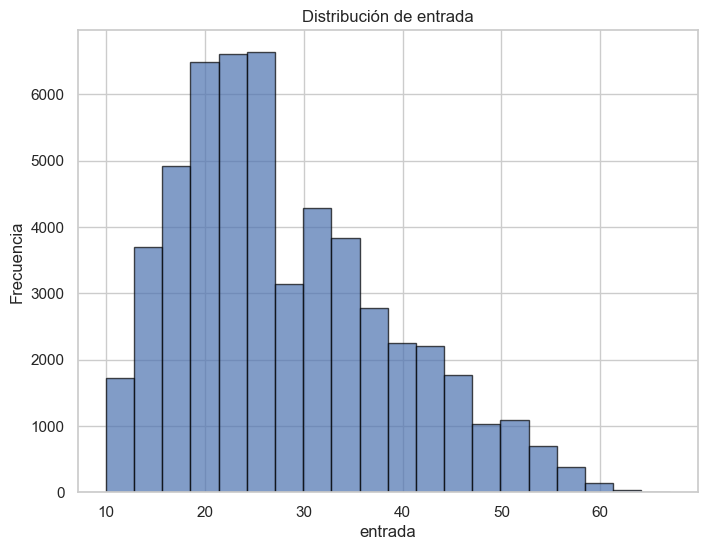

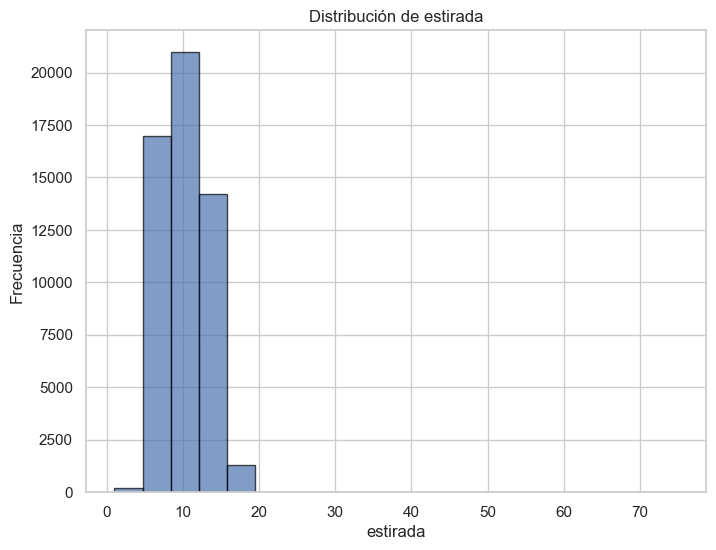

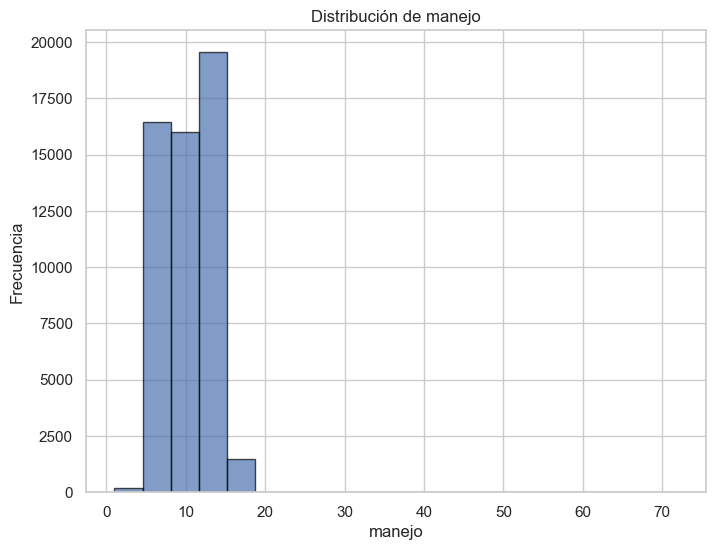

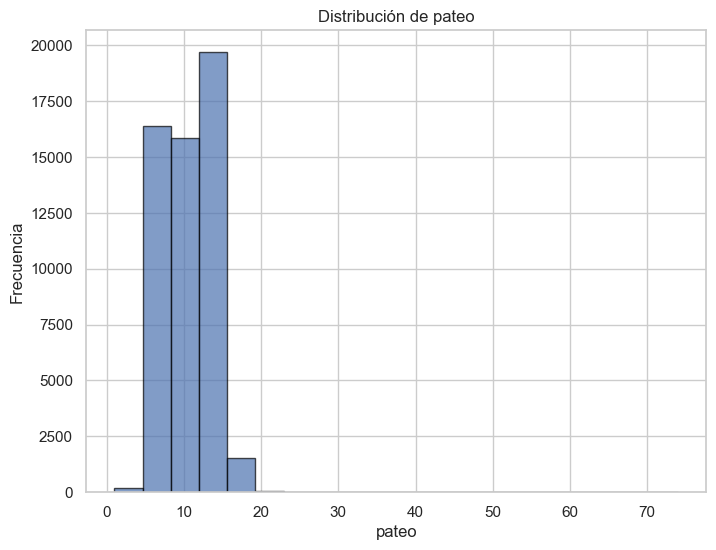

In [86]:
# Lista de las columnas de interés
columns_of_interest = [
    'chut', 'pase', 'regate', 'defensa_x', 'fisico',
    'centros_ataque', 'finalizacion', 'remate_cabeza', 'pase_corto_ataque',
    'volea', 'habilidad_regate', 'efecto', 'eficacia_faltas',
    'habilidad_pase_largo', 'habilidad_control', 'aceleracion',
    'velocidad_max', 'agilidad', 'reaccion', 'equilibrio', 'potencia_tiro',
    'potencia_salto', 'aguante', 'fortaleza', 'fuerza_chuts_lejanos',
    'agresividad', 'anticipacion', 'posicionamiento', 'vision_juego',
    'penalties', 'marcaje', 'abordaje', 'entrada', 'estirada', 'manejo',
    'pateo'
]

# Filtrar los jugadores que no sean porteros (excluir los que tengan 'POR' en la columna 'posicion')
jugadores_sin_porteros = jugadores_cluster_3[jugadores_cluster_3['posiciones'] != 'POR']

# Graficar las columnas de interés
for col in columns_of_interest:
    plt.figure(figsize=(8, 6))
    plt.hist(jugadores_sin_porteros[col], bins=20, edgecolor='black', alpha=0.7)
    plt.title(f'Distribución de {col}')
    plt.xlabel(col)
    plt.ylabel('Frecuencia')
    plt.grid(True)
    plt.show()


### valor_de_mercado por nacionalidad (top 5) y año

In [68]:
# Contar las nacionalidades más comunes
top_nacionalidades = jugadores_cluster_3['nacionalidad'].value_counts().head(5).index

# Filtrar jugadores que tengan alguna de las 5 nacionalidades más comunes
jugadores_top_nacionalidades = jugadores_cluster_3[jugadores_cluster_3['nacionalidad'].isin(top_nacionalidades)]

# Seleccionar las columnas 'valor_de_mercado', 'version' y 'nacionalidad'
trayectoria = jugadores_top_nacionalidades[['nacionalidad', 'valor_de_mercado', 'version_x']]

# Mostrar el resultado
print(trayectoria)


       nacionalidad  valor_de_mercado  version_x
27          Francia            925000       2015
28        Argentina           2000000       2015
36           Espana             80000       2015
37       Inglaterra            275000       2015
43       Inglaterra             40000       2015
...             ...               ...        ...
180000   Inglaterra            525000       2024
180001       Espana            275000       2024
180002   Inglaterra            275000       2024
180004      Francia            425000       2024
180017   Inglaterra            130000       2024

[16474 rows x 3 columns]


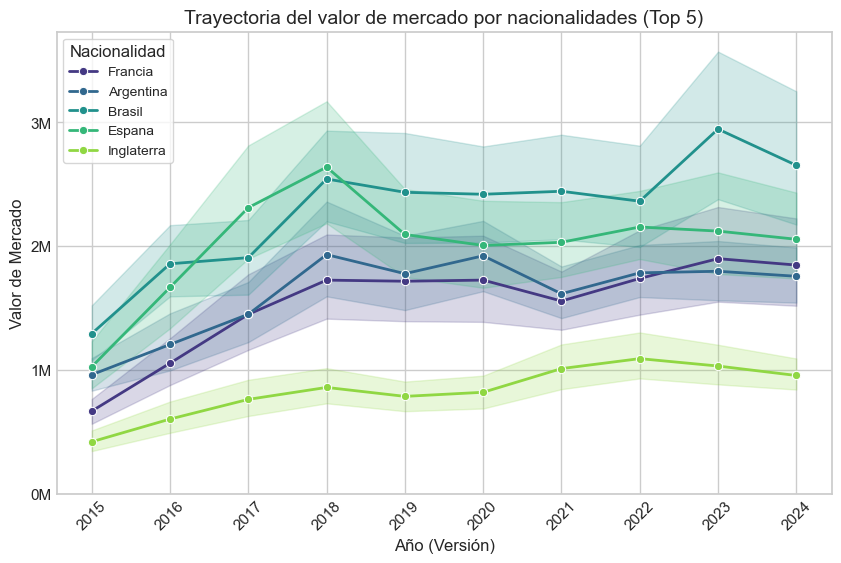

In [70]:
# Agrupar por nacionalidad y sumar el valor de mercado
top_5_nacionalidades = (
    jugadores_cluster_3.groupby("nacionalidad")["valor_de_mercado"]
    .sum()
    .nlargest(5)
    .index
)

# Filtrar los datos para incluir solo las nacionalidades del top 5
data_top_5 = jugadores_cluster_3[jugadores_cluster_3["nacionalidad"].isin(top_5_nacionalidades)]

# Configurar Seaborn para usar la paleta "Viridis"
sns.set_theme(style="whitegrid")
custom_palette = sns.color_palette("viridis", n_colors=5)  # Paleta Viridis con 5 colores

# Obtener el valor real más bajo para Inglaterra en 2015
valor_minimo = data_top_5[(data_top_5["nacionalidad"] == "Inglaterra") & (data_top_5["version_x"] == 2015)]["valor_de_mercado"].values[0]

# Crear el gráfico
plt.figure(figsize=(10, 6))
sns.lineplot(
    data=data_top_5,
    x="version_x",
    y="valor_de_mercado",
    hue="nacionalidad",
    palette=custom_palette,
    marker="o",  # Mostrar puntos en cada pico
    linewidth=2,  # Hacer la línea más simple
    markersize=6  # Tamaño de los puntos
)

# Ajustar el formato del eje Y para mostrar los valores en millones
plt.ticklabel_format(style='plain', axis='y')  # Esto desactiva la notación científica

# Establecer los valores de ticks para el eje Y en 0, 1M, 2M, 3M, etc.
yticks = [0, 1e6, 2e6, 3e6]  # Establecer los valores fijos para el eje Y: 0, 1M, 2M, 3M

plt.gca().set_yticks(yticks)  # Establecer estos valores como los nuevos ticks en el eje Y
plt.gca().set_yticklabels([f'{int(x / 1e6)}M' for x in yticks])  # Mostrar "M" al final

# Asegurarse de que todos los valores del eje X se muestren (por ejemplo, incluir el 2015)
plt.xticks(rotation=45)  # Rotar etiquetas para mejorar visibilidad
plt.gca().set_xticks(sorted(data_top_5['version_x'].unique()))  # Asegurarse de que se muestren todos los valores de version_x

# Ajustar los límites del eje Y para que comience en 0
plt.ylim(bottom=0)  # Asegurarse de que el eje Y comience en 0

# Personalizar etiquetas y título
plt.xlabel("Año (Versión)", fontsize=12)
plt.ylabel("Valor de Mercado", fontsize=12)
plt.title("Trayectoria del valor de mercado por nacionalidades (Top 5)", fontsize=14)
plt.legend(title="Nacionalidad", fontsize=10)

# Eliminar las sombras alrededor de las letras (en las etiquetas y el título)
plt.gca().tick_params(axis='both', which='both', length=0)  # Sin marcas adicionales
plt.gca().set_facecolor('white')  # Fondo blanco

# Guardar el CSV filtrado
data_top_5.to_csv("top_5_nacionalidades.csv", index=False)

# Mostrar el gráfico
plt.show()


/var/folders/cz/p2v7np113bv8lmvh4y3xdwtc0000gn/T/ipykernel_12046/983665628.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(
/var/folders/cz/p2v7np113bv8lmvh4y3xdwtc0000gn/T/ipykernel_12046/983665628.py:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([etiquetas_cluster[cluster] for cluster in promedios_por_cluster['cluster']])


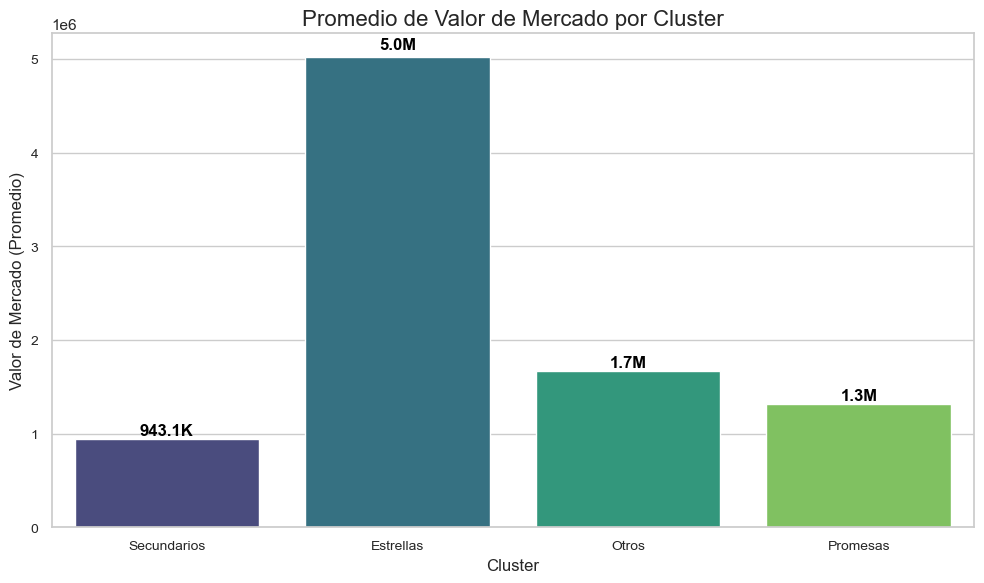

In [101]:
# Diccionario para renombrar los valores del eje x
etiquetas_cluster = {
    0: 'Secundarios',
    1: 'Estrellas',
    2: 'Otros',
    3: 'Promesas'
}

# Configurar estilo
sns.set_theme(style="whitegrid")

# Agrupar por cluster y calcular promedios
promedios_por_cluster = data_completa.groupby('cluster')['valor_de_mercado'].mean().reset_index()

# Función para formatear valores
def formatear_valor(valor):
    if valor >= 1_000_000:  # Millones
        return f"{valor / 1_000_000:.1f}M"
    elif valor >= 1_000:  # Miles
        return f"{valor / 1_000:.1f}K"
    else:
        return f"{valor:.0f}"  # Sin abreviar si es menor a 1,000

# Crear el gráfico de barras
plt.figure(figsize=(10, 6))
ax = sns.barplot(
    data=promedios_por_cluster,
    x='cluster',
    y='valor_de_mercado',
    palette="viridis"  # Usar paleta Viridis
)

# Renombrar las etiquetas del eje x
ax.set_xticklabels([etiquetas_cluster[cluster] for cluster in promedios_por_cluster['cluster']])

# Añadir valores formateados sobre las barras
for i, bar in enumerate(ax.patches):
    bar_value = bar.get_height()
    ax.text(
        bar.get_x() + bar.get_width() / 2,  # Posición horizontal
        bar_value + (bar_value * 0.01),    # Posición vertical (ligeramente arriba de la barra)
        formatear_valor(bar_value),        # Valor formateado
        ha='center', va='bottom', fontsize=12, color='black', fontweight='bold'
    )

# Etiquetas y título
plt.title("Promedio de Valor de Mercado por Cluster", fontsize=16)
plt.xlabel("Cluster", fontsize=12)
plt.ylabel("Valor de Mercado (Promedio)", fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Mostrar el gráfico
plt.tight_layout()
plt.show()


### salario_semanal por nacionalidad (top 5) y temporada

/var/folders/cz/p2v7np113bv8lmvh4y3xdwtc0000gn/T/ipykernel_12046/1699681933.py:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  plt.gca().set_yticklabels(yticks_millones)


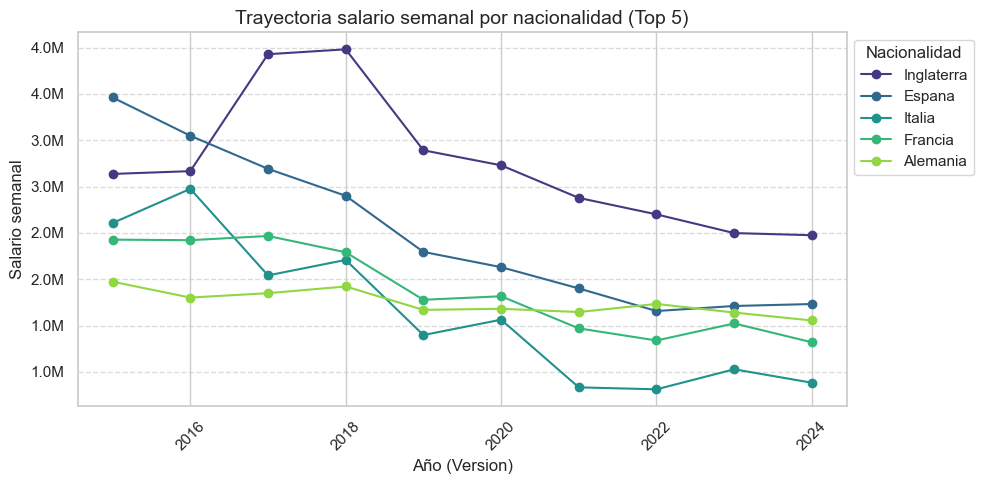

In [88]:
# Filtrar los datos por las nacionalidades seleccionadas y agrupar por 'nacionalidad' y 'version_x'
nacionalidades_seleccionadas = [
    "Inglaterra", "Espana", "Italia", "Francia", "Alemania"
]
datos_filtrados = jugadores_cluster_3[jugadores_cluster_3['nacionalidad'].isin(nacionalidades_seleccionadas)]
datos_agrupados_por_version = datos_filtrados.groupby(['nacionalidad', 'version_x'])['salario_semanal'].sum().reset_index()

# Reorganizar los datos en una tabla pivote para facilitar la visualización
datos_pivoteados = datos_agrupados_por_version.pivot(index='version_x', columns='nacionalidad', values='salario_semanal').reindex(columns=nacionalidades_seleccionadas)

# Graficar un gráfico de líneas para cada nacionalidad
plt.figure(figsize=(10, 5))

# Usar la paleta Viridis
viridis_palette = sns.color_palette("viridis", n_colors=len(datos_pivoteados.columns))

# Graficar cada nacionalidad con la paleta Viridis
for i, nacionalidad in enumerate(datos_pivoteados.columns):
    plt.plot(datos_pivoteados.index, datos_pivoteados[nacionalidad], marker='o', label=nacionalidad, color=viridis_palette[i])

# Ajustar el título y las etiquetas
plt.title('Trayectoria salario semanal por nacionalidad (Top 5)', fontsize=14)
plt.xlabel('Año (Version)', fontsize=12)
plt.ylabel('Salario semanal', fontsize=12)

# Ajustar los valores del eje Y en millones
plt.ticklabel_format(style='plain', axis='y')  # Desactivar la notación científica
yticks = plt.gca().get_yticks()  # Obtener los valores actuales de los ticks
yticks = [int(x) for x in yticks]  # Convertir los valores a enteros
yticks_millones = [f'{x // 1e6}M' for x in yticks]  # Convertir los valores en millones con "M"

# Ajustar los valores del eje Y con el formato en millones
plt.gca().set_yticklabels(yticks_millones)

# Ajustar los ticks del eje X para rotarlos y mejorar la visibilidad
plt.xticks(rotation=45)

# Agregar leyenda y mejorar la visualización
plt.legend(title='Nacionalidad', bbox_to_anchor=(1, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

# Mostrar el gráfico
plt.show()


### nacionalidad por nombres_liga

/var/folders/cz/p2v7np113bv8lmvh4y3xdwtc0000gn/T/ipykernel_12046/2557823141.py:21: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.nlargest(5, 'count'))  # Filtrar las 5 nacionalidades más comunes


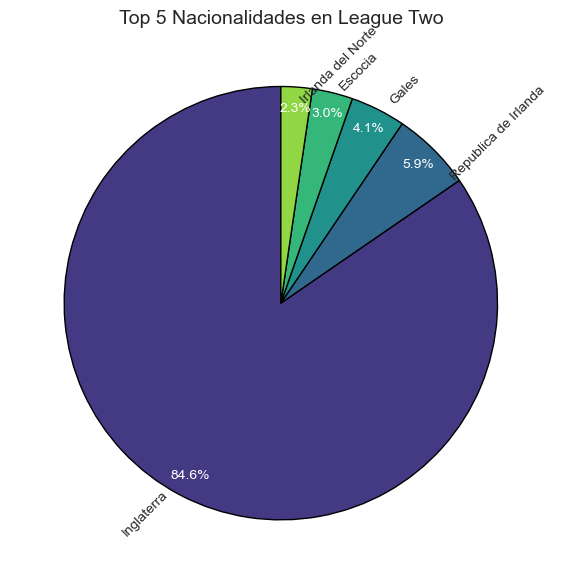

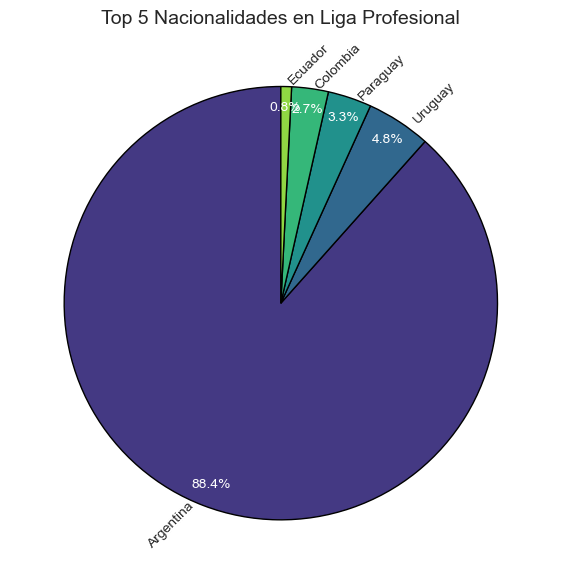

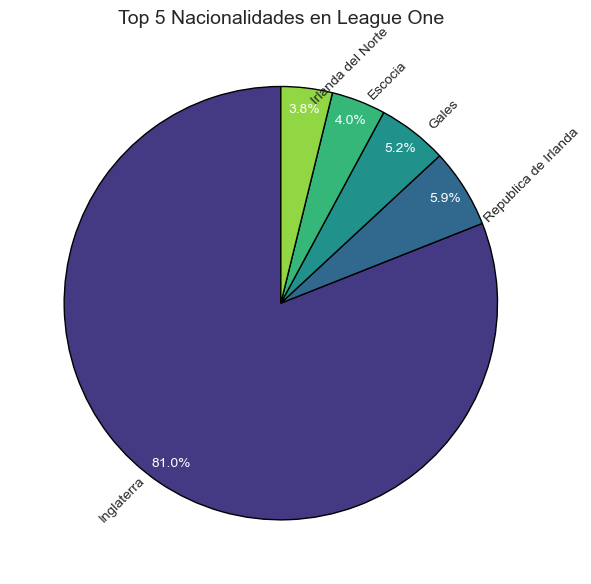

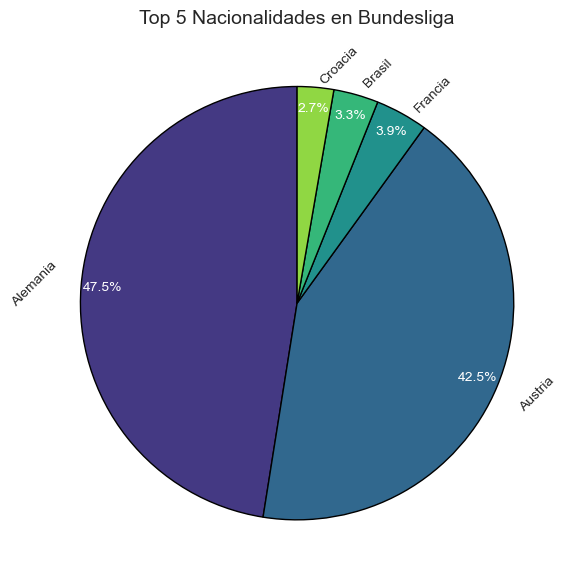

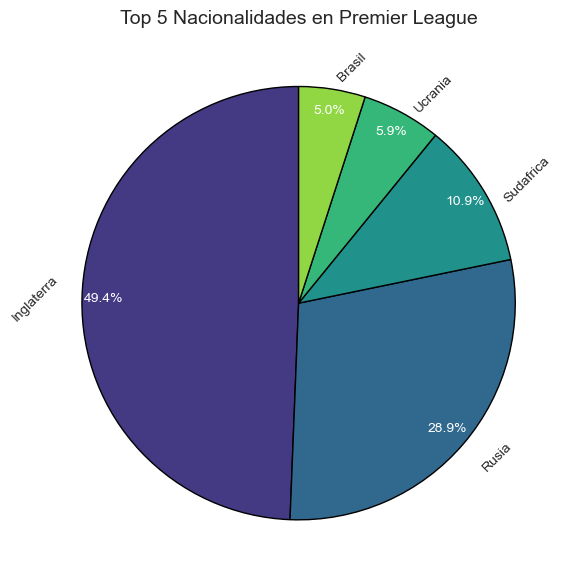

In [90]:
# Paso 1: Identificar los 5 nombres_liga más comunes
top_ligas = jugadores_cluster_3['nombre_liga_x'].value_counts().head(5).index

# Paso 2: Filtrar los datos para incluir solo los Top 5 nombres_liga
data_top_ligas = jugadores_cluster_3[jugadores_cluster_3['nombre_liga_x'].isin(top_ligas)]

# Paso 3: Contar las nacionalidades dentro de cada nombre_liga
top_nacionalidades_por_liga = (
    data_top_ligas.groupby(['nombre_liga_x', 'nacionalidad'])
    .size()  # Cuenta las ocurrencias
    .reset_index(name='count')  # Convierte el resultado a un DataFrame
)

# Paso 4: Seleccionar las Top 5 nacionalidades por cada liga
top_nacionalidades_por_liga = (
    top_nacionalidades_por_liga.groupby('nombre_liga_x')
    .apply(lambda x: x.nlargest(5, 'count'))  # Filtrar las 5 nacionalidades más comunes
    .reset_index(drop=True)
)

# Paso 5: Crear gráficos de pastel con etiquetas claras
for liga in top_ligas:
    data_liga = top_nacionalidades_por_liga[top_nacionalidades_por_liga['nombre_liga_x'] == liga]
    nacionalidades = data_liga['nacionalidad']
    counts = data_liga['count']

    # Obtener colores de la paleta 'Viridis'
    viridis_palette = sns.color_palette("viridis", n_colors=len(nacionalidades))

    # Crear el gráfico de pastel
    plt.figure(figsize=(8, 6))
    wedges, texts, autotexts = plt.pie(
        counts,
        labels=nacionalidades,
        autopct='%1.1f%%',  # Mostrar porcentaje con 1 decimal
        startangle=90,
        textprops={'fontsize': 10},  # Tamaño de las etiquetas de los países (más pequeño)
        colors=viridis_palette,  # Aplicar paleta Viridis
        pctdistance=0.9,  # Colocar los porcentajes cerca del borde de la tarta
        wedgeprops={'edgecolor': 'black'}  # Añadir borde negro a las porciones
    )

    # Cambiar color de los porcentajes a blanco
    for autotext in autotexts:
        autotext.set_color('white')  # Cambiar el color de los porcentajes a blanco

    # Rotar las etiquetas (si es necesario)
    for text in texts:
        text.set_rotation(45)  # Rotar las etiquetas 45 grados

    # Configurar títulos y mostrar el gráfico
    plt.title(f"Top 5 Nacionalidades en {liga}", fontsize=14)
    plt.tight_layout()  # Ajustar el espacio del gráfico
    plt.show()


### estiradas 

In [92]:
# Calcular el promedio de altura por cluster
promedio_estirada_por_cluster = data_completa.groupby('cluster')['estirada'].mean()

# Encontrar el cluster con la mayor altura promedio
cluster_mayor_altura = promedio_estirada_por_cluster.idxmax()
mayor_promedio_altura = promedio_estirada_por_cluster.max()

# Mostrar los resultados
print("Promedio de estirada por cluster:")
print(promedio_estirada_por_cluster)
print(f"\nEl cluster con la mayor estirada promedio es: {cluster_mayor_altura} con un promedio de {mayor_promedio_altura:.2f} cm.")


Promedio de estirada por cluster:
cluster
0    10.387142
1    10.511238
2    65.147286
3    10.364615
Name: estirada, dtype: float64

El cluster con la mayor estirada promedio es: 2 con un promedio de 65.15 cm.


### posicion 

In [105]:
# Obtener el conteo de los valores únicos en la columna "posiciones", ordenado de mayor a menor
conteo_posiciones = data_completa["posiciones"].value_counts().sort_values(ascending=False)

# Imprimir cada valor único y su conteo en un bucle
for posicion, conteo in conteo_posiciones.items():
    print(f"{posicion}: {conteo}")

CEN: 22479
POR: 20024
DC: 17883
MEC: 7708
MCD, MEC: 7443
LIZ: 6588
MEC, MCD: 6059
LAD: 5873
MCD: 3496
MCO: 2804
CEN, LAD: 2733
MED: 2363
MEI: 2308
MCO, MEC: 2070
CEN, LIZ: 2009
MED, MEI: 1992
MEI, MED: 1965
MEC, MCO: 1875
LIZ, MEI: 1865
CEN, MCD: 1863
LAD, LIZ: 1417
LAD, MED: 1350
LAD, CEN: 1308
LIZ, CEN: 1120
MCD, CEN: 1013
DC, MED: 995
EXD: 978
DC, MEI: 950
LIZ, CAI: 938
EXI: 856
DC, MCO: 851
DC, EXI: 842
DC, MPN: 840
DC, EXD: 837
LAD, CAD: 801
EXD, EXI: 794
EXI, EXD: 784
MEC, MCD, MCO: 770
MCO, MEI: 737
LIZ, LAD: 651
MED, DC: 614
MEI, MCO: 605
MEI, DC: 604
MEC, MED: 587
MCO, MED: 568
MEC, MCO, MCD: 532
MCD, MEC, CEN: 532
MED, EXD: 531
MEI, EXI: 523
MCO, DC: 510
MED, MCO: 508
MEI, LIZ: 473
MEC, MEI: 450
MED, LAD: 439
MED, MEC: 380
EXD, MED: 355
EXD, DC: 354
MEI, MEC: 349
MED, MEI, MCO: 346
MCO, MPN: 342
MED, MEI, DC: 334
MEI, MED, MCO: 332
CAI, LIZ: 326
EXI, DC: 315
EXI, MEI: 311
CAD, LAD: 308
MEI, MED, DC: 307
MCO, MEI, MED: 294
MCD, MEC, MCO: 292
DC, MED, MEI: 288
MCD, CEN, MEC: 28

/var/folders/cz/p2v7np113bv8lmvh4y3xdwtc0000gn/T/ipykernel_12046/1314479803.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=porcentajes.index, y=porcentajes.values, palette=colores)  # Usar los colores generados
/var/folders/cz/p2v7np113bv8lmvh4y3xdwtc0000gn/T/ipykernel_12046/1314479803.py:19: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  ax = sns.barplot(x=porcentajes.index, y=porcentajes.values, palette=colores)  # Usar los colores generados


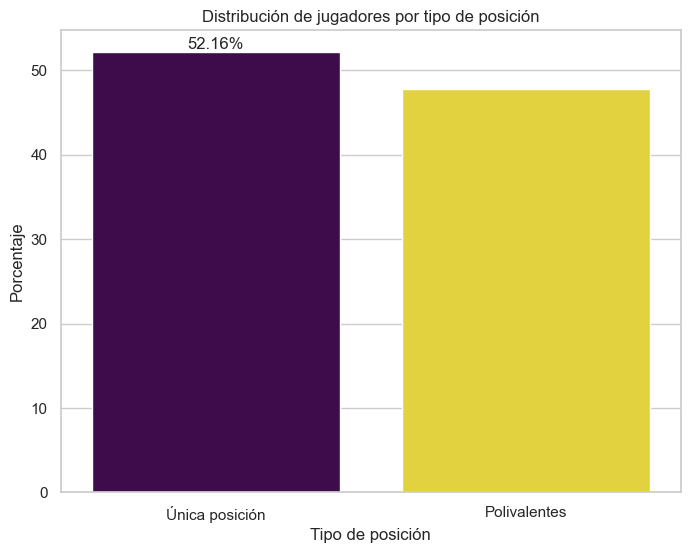

In [111]:
# Contar jugadores con una sola posición vs polivalentes
data_completa["es_polivalente"] = data_completa["posiciones"].apply(lambda x: "Polivalentes" if "," in x else "Única posición")
conteo_posiciones = data_completa["es_polivalente"].value_counts()

# Convertir a porcentajes
porcentajes = (conteo_posiciones / conteo_posiciones.sum()) * 100

# Generar colores discretos a partir de la paleta 'viridis'
num_colores = len(porcentajes)  # El número de barras
colores = plt.cm.viridis(np.linspace(0, 1, num_colores))  # Colores discretos de viridis

# Graficar los porcentajes
plt.figure(figsize=(8, 6))
ax = sns.barplot(x=porcentajes.index, y=porcentajes.values, palette=colores)  # Usar los colores generados
ax.bar_label(ax.containers[0], fmt="%.2f%%")
plt.title("Distribución de jugadores por tipo de posición")
plt.ylabel("Porcentaje")
plt.xlabel("Tipo de posición")
plt.show()


In [119]:
# Total de jugadores en la tabla
total_jugadores = len(data_completa)

# Total de jugadores con posiciones únicas
jugadores_unica_posicion = len(unica_posicion)

# Porcentaje que representan los jugadores con posición única
porcentaje_unicas = (jugadores_unica_posicion / total_jugadores) * 100

# Mostrar resultados
print(f"Total de jugadores: {total_jugadores}")
print(f"Total de jugadores con posiciones únicas: {jugadores_unica_posicion}")
print(f"Porcentaje de jugadores con posiciones únicas: {porcentaje_unicas:.2f}%")

Total de jugadores: 180021
Total de jugadores con posiciones únicas: 93902
Porcentaje de jugadores con posiciones únicas: 52.16%


/var/folders/cz/p2v7np113bv8lmvh4y3xdwtc0000gn/T/ipykernel_12046/2629502006.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=conteo_unicas.index, y=conteo_unicas.values, palette=colores)  # Usar los colores generados
/var/folders/cz/p2v7np113bv8lmvh4y3xdwtc0000gn/T/ipykernel_12046/2629502006.py:16: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  ax = sns.barplot(x=conteo_unicas.index, y=conteo_unicas.values, palette=colores)  # Usar los colores generados


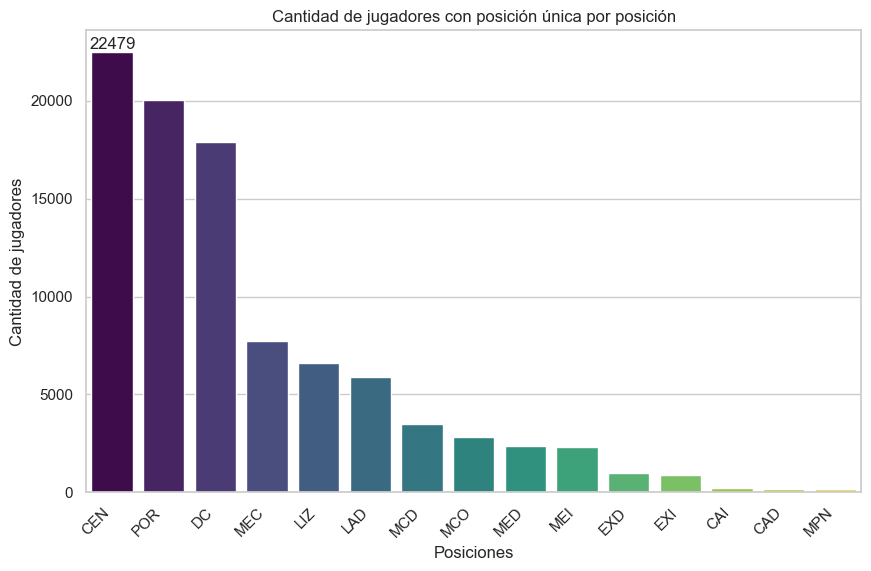

In [115]:
# Filtrar jugadores con posición única
unica_posicion = data_completa[~data_completa["posiciones"].str.contains(",")]  # Filtrar posiciones sin comas
conteo_unicas = unica_posicion["posiciones"].value_counts()  # Contar por posición

# Generar colores discretos a partir de la paleta 'viridis'
num_colores = len(conteo_unicas)  # El número de barras
colores = plt.cm.viridis(np.linspace(0, 1, num_colores))  # Colores discretos de viridis

# Graficar las cantidades
plt.figure(figsize=(10, 6))
ax = sns.barplot(x=conteo_unicas.index, y=conteo_unicas.values, palette=colores)  # Usar los colores generados
ax.bar_label(ax.containers[0], fmt="%d")
plt.title("Cantidad de jugadores con posición única por posición")
plt.ylabel("Cantidad de jugadores")
plt.xlabel("Posiciones")
plt.xticks(rotation=45, ha="right")  # Rotar etiquetas para mayor claridad
plt.show()

### posicion no portero en cluster Otros

In [191]:
# Filtrar los jugadores que cumplen las condiciones:
# 1. No tienen "POR" en la columna 'posiciones'.
# 2. Tienen el valor "2" en la columna 'cluster'. Nota: 2 porque ejecuté el codigo de nuevo y cambio desde scrip kmeans
jugadores_filtrados = data_completa[
    (data_completa['posiciones'] != 'POR') & (data_completa['cluster'] == 2)
]

# Totalizar el número de jugadores que cumplen ambas condiciones
total_jugadores = len(jugadores_filtrados)

print(f"Total de jugadores que no son 'POR': {total_jugadores}")


Total de jugadores que no son 'POR': 5


In [189]:
# Filtrar los jugadores que cumplen las condiciones:
# 1. No tienen "POR" en la columna 'posiciones'.
# 2. Tienen el valor "2" en la columna 'cluster'. Nota: 2 porque ejecuté el codigo de nuevo y cambio desde scrip kmeans
jugadores_filtrados = data_completa[
    (data_completa['posiciones'] == 'POR') & (data_completa['cluster'] == 2)
]

# Totalizar el número de jugadores que cumplen ambas condiciones
total_jugadores = len(jugadores_filtrados)

print(f"Total de jugadores que  son 'POR': {total_jugadores}")

Total de jugadores que  son 'POR': 20024


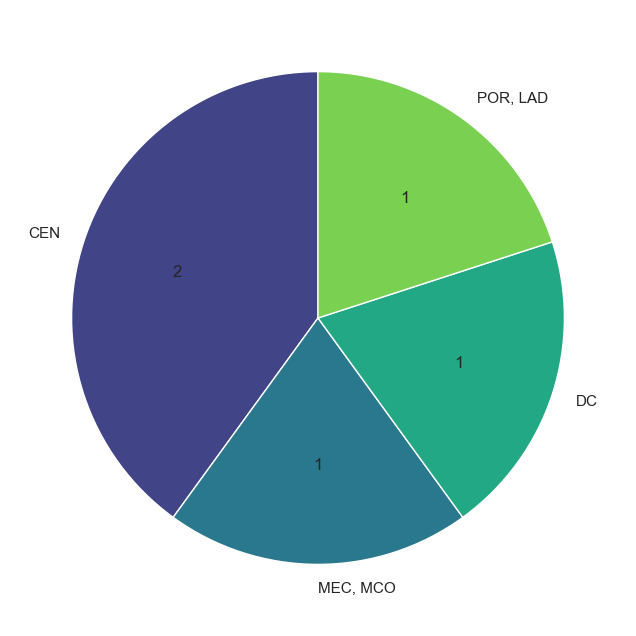

In [197]:
# Calcular las posiciones y sus cantidades en el cluster
cluster_posiciones = jugadores_filtrados['posiciones'].value_counts()

# Generar una paleta de colores Viridis con el número adecuado de colores
viridis_colors = sns.color_palette("viridis", n_colors=len(cluster_posiciones))

# Crear gráfico circular
plt.figure(figsize=(8, 8))
plt.pie(
    cluster_posiciones, 
    labels=cluster_posiciones.index, 
    autopct=lambda p: f'{int(p * cluster_posiciones.sum() / 100)}',  # Mostrar números absolutos
    startangle=90, 
    colors=viridis_colors
)
plt.show()


### nacionalidad: mayoria ingleses

In [126]:
# Totalizar la cantidad de jugadores por nacionalidad
nacionalidad_counts = data_completa["nacionalidad"].value_counts()

# Calcular el total de jugadores
total_jugadores = len(data_completa)

# Extraer la cantidad de jugadores ingleses
jugadores_ingleses = nacionalidad_counts.get("Inglaterra", 0)

# Calcular el porcentaje de ingleses sobre el total
porcentaje_ingleses = (jugadores_ingleses / total_jugadores) * 100

# Imprimir resultados
print(f"Total de jugadores por nacionalidad:\n{nacionalidad_counts}")
print(f"\nTotal de jugadores: {total_jugadores}")
print(f"Total de jugadores ingleses: {jugadores_ingleses}")
print(f"Porcentaje de jugadores ingleses: {porcentaje_ingleses:.2f}%")

Total de jugadores por nacionalidad:
nacionalidad
Inglaterra    16415
Espana        10474
Alemania      10412
Francia        9659
Argentina      9658
              ...  
Butan             1
Singapur          1
Vanuatu           1
Nepal             1
Pakistan          1
Name: count, Length: 188, dtype: int64

Total de jugadores: 180021
Total de jugadores ingleses: 16415
Porcentaje de jugadores ingleses: 9.12%


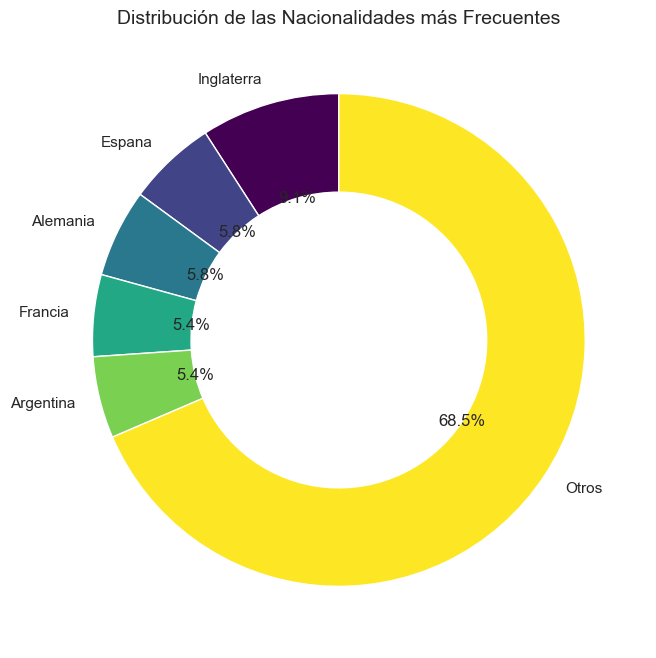

Total de jugadores por nacionalidad (agrupado):
Inglaterra     16415
Espana         10474
Alemania       10412
Francia         9659
Argentina       9658
Otros         123403
dtype: int64


In [134]:
# Totalizar la cantidad de jugadores por nacionalidad
nacionalidad_counts = data_completa["nacionalidad"].value_counts()

# Seleccionar las top 5 nacionalidades
top_5_nacionalidades = nacionalidad_counts.head(5)

# Agrupar el resto de las nacionalidades bajo "Otros"
otros = nacionalidad_counts.iloc[5:].sum()

# Crear una nueva serie con "Otros"
otros_series = pd.Series({"Otros": otros})

# Concatenar las top 5 con "Otros"
nacionalidad_counts_agrupado = pd.concat([top_5_nacionalidades, otros_series])

# Número de colores que necesitamos
num_colores = len(nacionalidad_counts_agrupado)

# Generar colores discretos a partir de la paleta 'viridis'
colores = plt.cm.viridis(np.linspace(0, 1, num_colores))

# Graficar el resultado en formato dona
plt.figure(figsize=(8, 8))
# Graficar en formato dona usando 'pie' y asignando colores discretos
plt.pie(nacionalidad_counts_agrupado, labels=nacionalidad_counts_agrupado.index,
        autopct='%1.1f%%', startangle=90, colors=colores,
        wedgeprops={'width': 0.4}),  # Ajuste para el "agujero" de la dona
        
# Título del gráfico
plt.title("Distribución de las Nacionalidades más Frecuentes", fontsize=14)
plt.show()

# Imprimir resultados
print(f"Total de jugadores por nacionalidad (agrupado):\n{nacionalidad_counts_agrupado}")

### ligas: mayoria premiere league

In [139]:
# Totalizar la cantidad de jugadores por liga
liga_counts = data_completa["nombre_liga_x"].value_counts()

# Calcular el total de jugadores
total_jugadores = len(data_completa)

# Extraer la cantidad de jugadores en la Premier League
jugadores_premier_league = liga_counts.get("Premier League", 0)

# Calcular el porcentaje de jugadores en la Premier League sobre el total
porcentaje_premier_league = (jugadores_premier_league / total_jugadores) * 100

# Imprimir resultados
print(f"Total de jugadores por liga:\n{liga_counts}")
print(f"\nTotal de jugadores: {total_jugadores}")
print(f"Total de jugadores en la Premier League: {jugadores_premier_league}")
print(f"Porcentaje de jugadores en la Premier League: {porcentaje_premier_league:.2f}%")


Total de jugadores por liga:
nombre_liga_x
Premier League         9371
Serie A                8406
Bundesliga             8279
Liga Profesional       7505
Super League           7268
Championship           7138
Major League Soccer    6647
League One             6429
League Two             6371
La Liga 2              6303
Ligue 2                6024
La Liga                5946
Serie B                5375
Super Lig              5187
Ligue 1                5088
Primera Division       5066
Liga Portugal          5061
Eredivisie             4823
Pro League             4571
2. Bundesliga          4480
Jupiler Pro League     4460
Ekstraklasa            4394
3. Liga                4347
Liga MX                4076
Allsvenskan            4035
Liga BetPlay           4004
Eliteserien            3975
K League 1             3354
Superliga              3257
Premiership            3226
J-League               3188
Premier Division       2657
A-League               2463
Liga 1                 2107
Otros

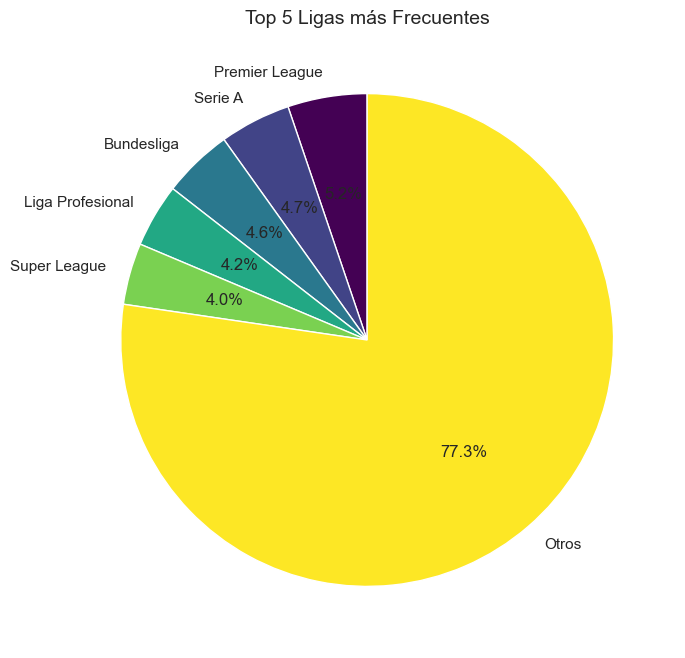

Total de jugadores por liga (agrupado):
Premier League        9371
Serie A               8406
Bundesliga            8279
Liga Profesional      7505
Super League          7268
Otros               139192
dtype: int64


In [143]:
# Totalizar la cantidad de jugadores por liga
liga_counts = data_completa["nombre_liga_x"].value_counts()

# Seleccionar las top 5 ligas más frecuentes
top_5_ligas = liga_counts.head(5)

# Agrupar el resto de las ligas bajo "Otros"
otros = liga_counts.iloc[5:].sum()

# Crear una nueva serie con "Otros"
otros_series = pd.Series({"Otros": otros})

# Concatenar las top 5 con "Otros"
liga_counts_agrupado = pd.concat([top_5_ligas, otros_series])

# Número de colores que necesitamos (para cada segmento del gráfico)
num_colores = len(liga_counts_agrupado)

# Generar colores discretos a partir de la paleta 'viridis'
colores = plt.cm.viridis(np.linspace(0, 1, num_colores))

# Graficar el resultado en formato pastel
plt.figure(figsize=(8, 8))
plt.pie(liga_counts_agrupado, labels=liga_counts_agrupado.index, autopct='%1.1f%%', startangle=90, 
        colors=colores)  # Usar los colores de la paleta viridis

# Título del gráfico
plt.title("Top 5 Ligas más Frecuentes", fontsize=14)
plt.show()

# Imprimir resultados
print(f"Total de jugadores por liga (agrupado):\n{liga_counts_agrupado}")


### version: 2022 mayor catidad de jugadores

/var/folders/cz/p2v7np113bv8lmvh4y3xdwtc0000gn/T/ipykernel_12046/2327340022.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=jugadores_por_ano.index, y=jugadores_por_ano.values, palette=colores)
/var/folders/cz/p2v7np113bv8lmvh4y3xdwtc0000gn/T/ipykernel_12046/2327340022.py:12: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  ax = sns.barplot(x=jugadores_por_ano.index, y=jugadores_por_ano.values, palette=colores)


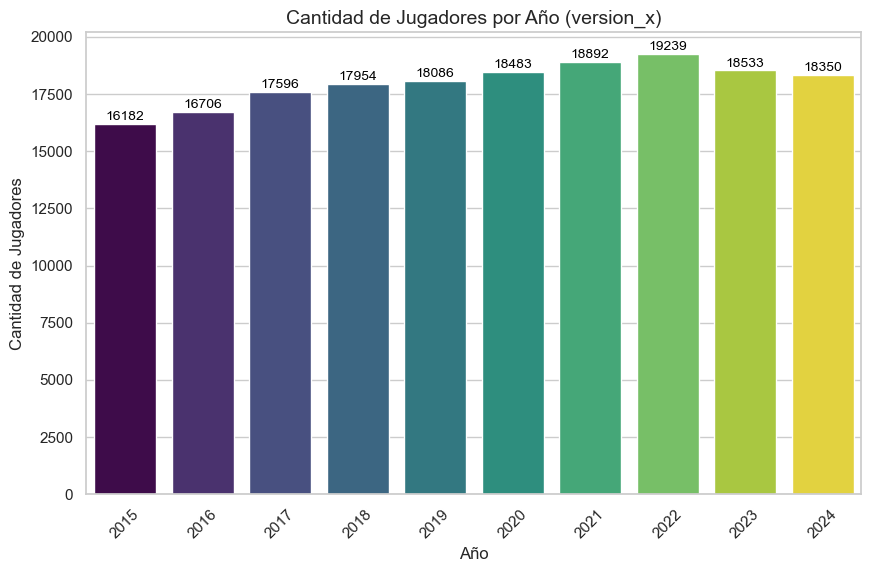

Total de jugadores por año (version_x):
version_x
2015    16182
2016    16706
2017    17596
2018    17954
2019    18086
2020    18483
2021    18892
2022    19239
2023    18533
2024    18350
Name: count, dtype: int64


In [146]:
# Totalizar la cantidad de jugadores por versión (año)
jugadores_por_ano = data_completa["version_x"].value_counts().sort_index()

# Graficar la cantidad de jugadores por año (version_x) en un gráfico de barras
plt.figure(figsize=(10, 6))

# Crear el gráfico de barras usando la paleta viridis con colores únicos para cada barra
num_barras = len(jugadores_por_ano)
colores = plt.cm.viridis(np.linspace(0, 1, num_barras))  # Generar colores distintos de viridis

# Crear el gráfico de barras con colores personalizados
ax = sns.barplot(x=jugadores_por_ano.index, y=jugadores_por_ano.values, palette=colores)

# Añadir los totales sobre cada barra
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', 
                fontsize=10, color='black', 
                xytext=(0, 5), textcoords='offset points')

# Títulos y etiquetas
plt.title("Cantidad de Jugadores por Año (version_x)", fontsize=14)
plt.xlabel("Año", fontsize=12)
plt.ylabel("Cantidad de Jugadores", fontsize=12)
plt.xticks(rotation=45)  # Rotar etiquetas para mayor claridad

# Mostrar el gráfico
plt.show()

# Imprimir resultados
print(f"Total de jugadores por año (version_x):\n{jugadores_por_ano}")

### Bucle atributos especiales

/var/folders/cz/p2v7np113bv8lmvh4y3xdwtc0000gn/T/ipykernel_12046/2946199752.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(
/var/folders/cz/p2v7np113bv8lmvh4y3xdwtc0000gn/T/ipykernel_12046/2946199752.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([etiquetas_cluster[cluster] for cluster in promedios_por_cluster['cluster']])


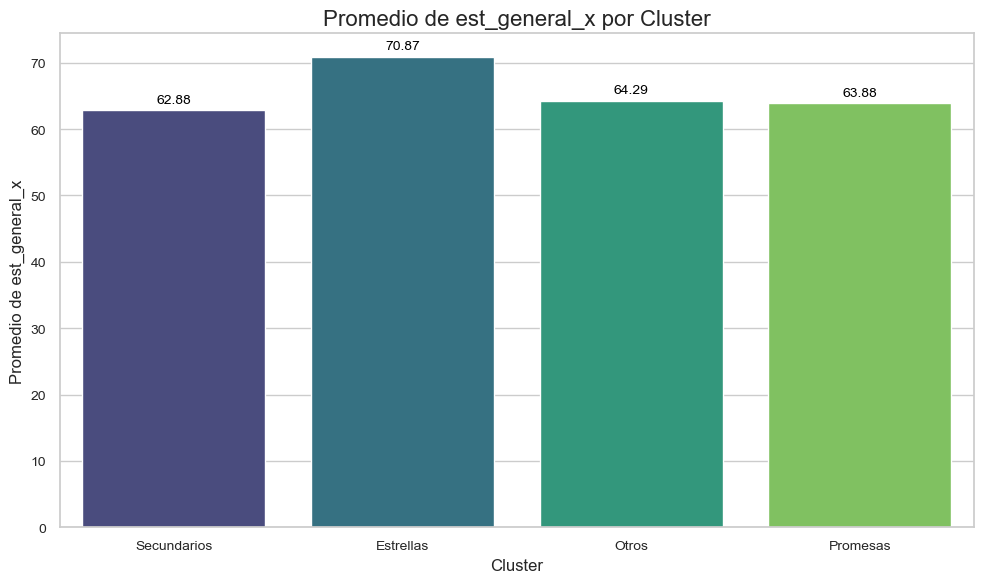

/var/folders/cz/p2v7np113bv8lmvh4y3xdwtc0000gn/T/ipykernel_12046/2946199752.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(
/var/folders/cz/p2v7np113bv8lmvh4y3xdwtc0000gn/T/ipykernel_12046/2946199752.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([etiquetas_cluster[cluster] for cluster in promedios_por_cluster['cluster']])


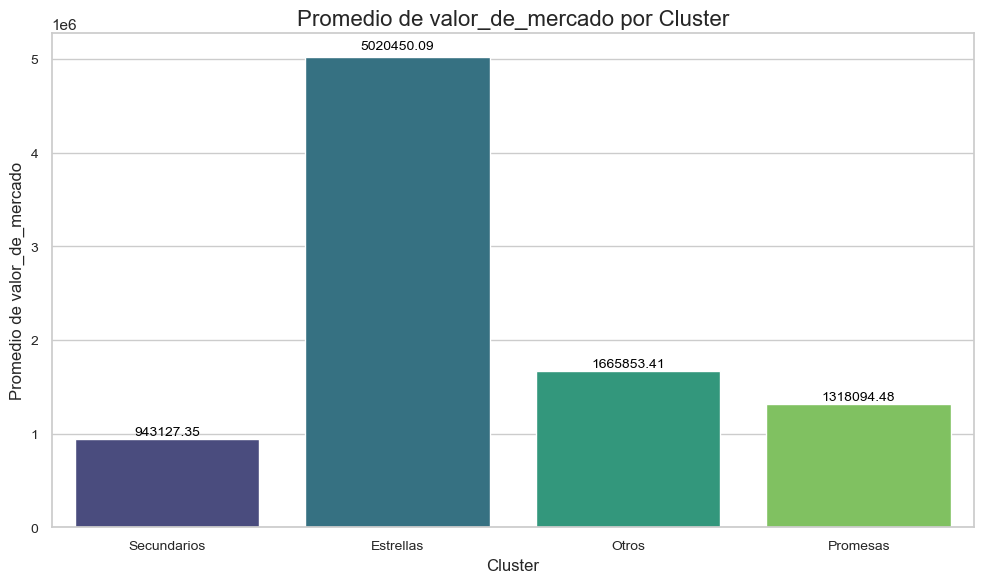

/var/folders/cz/p2v7np113bv8lmvh4y3xdwtc0000gn/T/ipykernel_12046/2946199752.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(
/var/folders/cz/p2v7np113bv8lmvh4y3xdwtc0000gn/T/ipykernel_12046/2946199752.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([etiquetas_cluster[cluster] for cluster in promedios_por_cluster['cluster']])


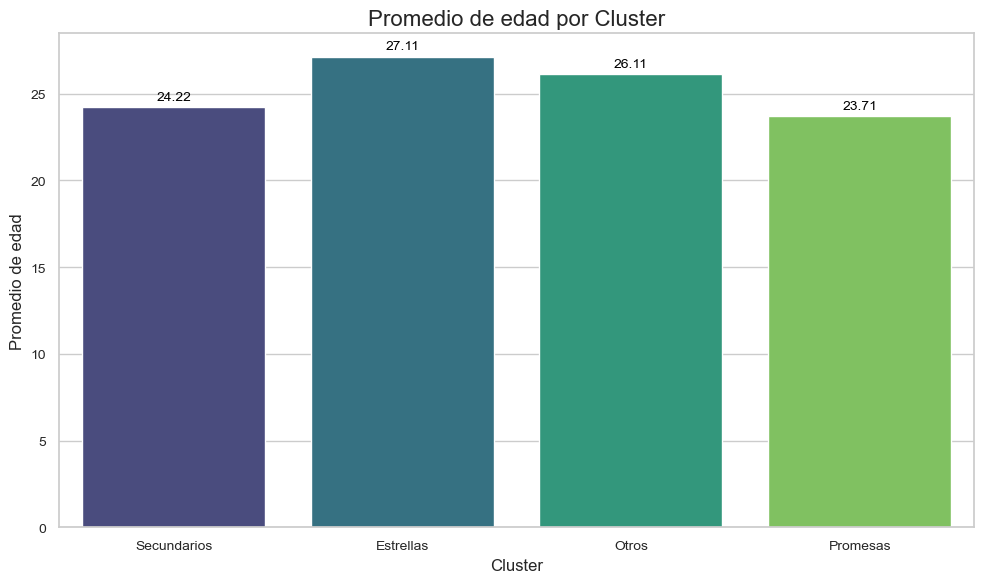

/var/folders/cz/p2v7np113bv8lmvh4y3xdwtc0000gn/T/ipykernel_12046/2946199752.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(
/var/folders/cz/p2v7np113bv8lmvh4y3xdwtc0000gn/T/ipykernel_12046/2946199752.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([etiquetas_cluster[cluster] for cluster in promedios_por_cluster['cluster']])


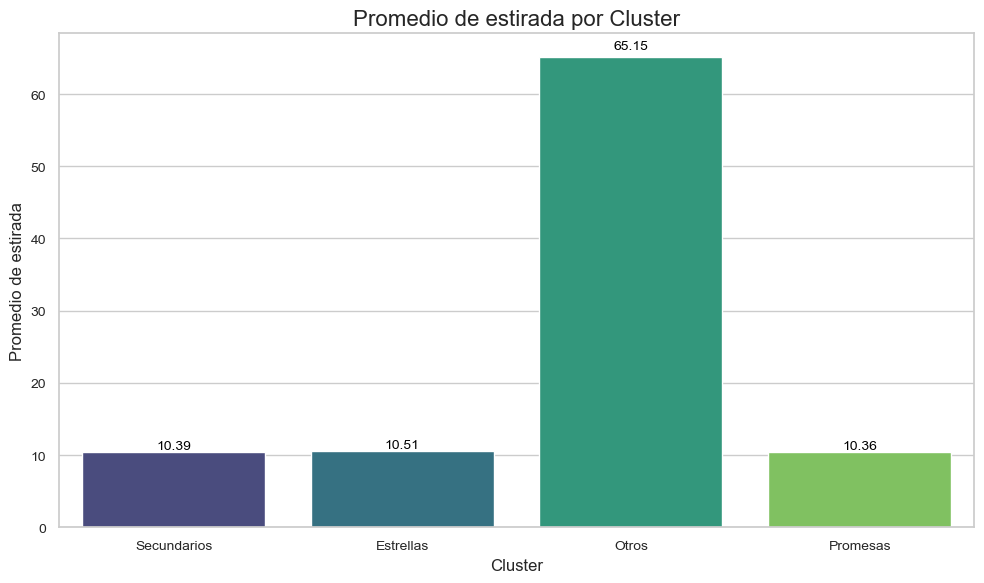

/var/folders/cz/p2v7np113bv8lmvh4y3xdwtc0000gn/T/ipykernel_12046/2946199752.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(
/var/folders/cz/p2v7np113bv8lmvh4y3xdwtc0000gn/T/ipykernel_12046/2946199752.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([etiquetas_cluster[cluster] for cluster in promedios_por_cluster['cluster']])


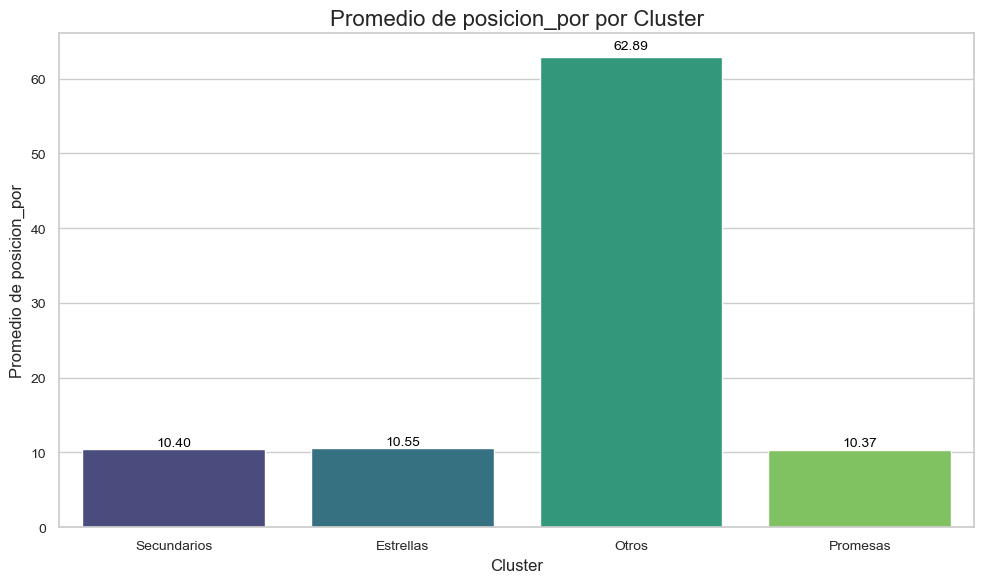

In [97]:
# Lista de columnas a graficar
columnas_a_graficar = [
    'est_general_x',
    'valor_de_mercado',
    'edad',
    'estirada',
    'posicion_por'
]

# Diccionario para renombrar los valores del eje x
etiquetas_cluster = {
    0: 'Secundarios',
    1: 'Estrellas',
    2: 'Otros',
    3: 'Promesas'
}

# Configurar estilo
sns.set_theme(style="whitegrid")

# Agrupar por cluster y calcular promedios
promedios_por_cluster = data_completa.groupby('cluster')[columnas_a_graficar].mean().reset_index()

# Iterar sobre cada columna para generar gráficos
for columna in columnas_a_graficar:
    plt.figure(figsize=(10, 6))
    
    # Crear gráfico de barras con los promedios
    ax = sns.barplot(
        data=promedios_por_cluster,
        x='cluster',
        y=columna,
        palette="viridis"  # Usar paleta Viridis
    )
    
    # Renombrar las etiquetas del eje x
    ax.set_xticklabels([etiquetas_cluster[cluster] for cluster in promedios_por_cluster['cluster']])
    
    # Añadir valores sobre las barras
    for i, bar in enumerate(ax.patches):
        bar_value = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width() / 2,  # Posición horizontal
            bar_value + (bar_value * 0.01),    # Posición vertical (ligeramente arriba de la barra)
            f'{bar_value:.2f}',               # Valor formateado
            ha='center', va='bottom', fontsize=10, color='black'
        )
    
    # Etiquetas y título
    plt.title(f"Promedio de {columna} por Cluster", fontsize=16)
    plt.xlabel("Cluster", fontsize=12)
    plt.ylabel(f"Promedio de {columna}", fontsize=12)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    
    # Mostrar el gráfico
    plt.tight_layout()
    plt.show()


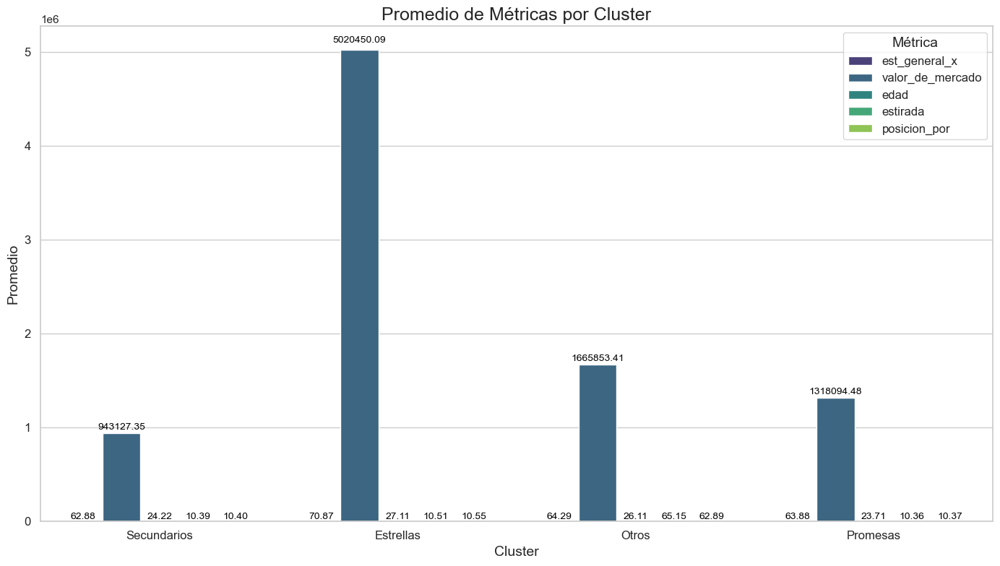

In [99]:
# Lista de columnas a graficar
columnas_a_graficar = [
    'est_general_x',
    'valor_de_mercado',
    'edad',
    'estirada',
    'posicion_por'
]

# Diccionario para renombrar los valores del eje x
etiquetas_cluster = {
    0: 'Secundarios',
    1: 'Estrellas',
    2: 'Otros',
    3: 'Promesas'
}

# Configurar estilo
sns.set_theme(style="whitegrid")

# Agrupar por cluster y calcular promedios
promedios_por_cluster = data_completa.groupby('cluster')[columnas_a_graficar].mean().reset_index()

# Renombrar los clusters para usar etiquetas más legibles
promedios_por_cluster['cluster'] = promedios_por_cluster['cluster'].map(etiquetas_cluster)

# Crear el gráfico de barras agrupadas
fig, ax = plt.subplots(figsize=(14, 8))

# Generar el gráfico
promedios_por_cluster_melted = promedios_por_cluster.melt(id_vars='cluster', 
                                                          var_name='Métrica', 
                                                          value_name='Promedio')

sns.barplot(
    data=promedios_por_cluster_melted,
    x='cluster',
    y='Promedio',
    hue='Métrica',
    palette='viridis',
    ax=ax
)

# Añadir valores sobre las barras
for bar in ax.patches:
    bar_value = bar.get_height()
    if bar_value > 0:  # Evitar mostrar etiquetas para barras vacías
        ax.text(
            bar.get_x() + bar.get_width() / 2,  # Posición horizontal
            bar_value + (bar_value * 0.01),    # Posición vertical
            f'{bar_value:.2f}',               # Valor formateado
            ha='center', va='bottom', fontsize=10, color='black'
        )

# Etiquetas y título
plt.title("Promedio de Métricas por Cluster", fontsize=18)
plt.xlabel("Cluster", fontsize=14)
plt.ylabel("Promedio", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Ajustar leyenda
plt.legend(title='Métrica', fontsize=12, title_fontsize=14)

# Mostrar el gráfico
plt.tight_layout()
plt.show()


# Creo CSV jugadores_cluster_3

In [ ]:
# Exportar jugadores_cluster_3 a un archivo CSV
jugadores_cluster_3.to_csv('jugadores_cluster_3.csv', index=False, encoding='utf-8')

print("El archivo CSV ha sido creado exitosamente.")